# GEONE - Variogram analysis and kriging for data in 3D with non-stationarity

The goal is to interpolate a non-stationary data set in 3D (based on simple or ordinary kriging) in a domain (grid), where non-stationarity are given as

- local orientation, i.e. map of angles defining the orientation of the main axes of the covariance model
- local factor (multiplier) for the ranges along the main axes of the covariance model
- local factor (multiplier) for the total weight (variance, sill) of the covariance model

One or several of these non-stationary features can be considered.

## Import what is required

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pyvista as pv
import time

# import package 'geone'
import geone as gn

In [2]:
# Show version of python and version of geone
import sys 
print(sys.version_info)
print('geone version: ' + gn.__version__)

sys.version_info(major=3, minor=13, micro=7, releaselevel='final', serial=0)
geone version: 1.3.0


In [3]:
pv.set_jupyter_backend('static') # static plots
# pv.set_jupyter_backend('trame')  # 3D-interactive plots

## I. Build non-stationary features on a grid
Here are built the following non-stationary features on a grid:

- `alpha_loc`, `beta_loc`, `gamma_loc`: local varying maps of orientation (angles `alpha`, `beta`, `gamma`), determining the orientation of the structures
- `r_factor_loc`: local factor (multiplier) for the ranges along the main axes of the covariance model
- `w_factor_loc`: local factor (multiplier) for the total weight (variance, sill) of the covariance model

### Defining domain of simulation (grid)

In [4]:
nx, ny, nz = 101, 101, 61  # number of cells
sx, sy, sz = 1.0, 1.0, 1.0  # cell unit
ox, oy, oz = -50.5, -50.5, -0.5  # origin

xmin, xmax = ox, ox+nx*sx
ymin, ymax = oy, oy+ny*sy
zmin, zmax = oz, oz+nz*sz

# Set an image with simulation grid geometry defined above, and no variable
im = gn.img.Img(nx, ny, nz, sx, sy, sz, ox, oy, oz, nv=0)

### Defining non-stationary orientation
The angles `alpha`, `beta`, `gamma`, locally varying in the grid are defined as 

- `im_alpha`, `im_beta`,`im_gamma`: images (with one variable on the grid)
- `alpha_loc_func`, `beta_loc_func`, `gamma_loc_func`: functions as a location (in the grid) (interpolating the values in the images, function built from images `im_alpha`, `im_beta`, `im_gamma`)

The class `geone.img.Img_interp_func` provides an interpolator (function) from the values of a variable at the centers of the grid cells of an image.

**Notes about interpolation of angles**

As two angles (in degrees) with a difference of (a multiple of) 360 represent the same orientation, some precautions have to be taken for interpolation. If there is no "jump" of 360 between angle values at close points (i.e. no discontinuities), the angles can be interpolated directly; otherwise, and in general, one can interpolate the cosine and the sine of the angles, and then retrieve the angles over the image grid.

In the class `geone.img.Img_interp_func`, one can specify that the variable is an angle with the keyword argument `angle_var=True`, then the interpolator uses cosine and sine before retrieving the angle, to avoid problem with the discontinuities ("jump of 360 degrees"). If there is no such discontinuities, `angle_var=False` (default value) may be used.

In this example (see below), the angle `alpha` shows discontinuities ("jump of 360 degrees") in the image (`im_alpha`), then `angle_var=True` is used. The angle `beta` (resp. `gamma`) does not present any discontinuity, and `angle_var=False` can be used.
Note that the angle `gamma` is equal to 0 everywhere, and the image (`im_gamma`) as well as its inperpolator (`gamma_loc_func`) are optional (but set in the example for general case).

In [5]:
# Set the range factor as function of the distance to c0 (defined a
cells_center = np.array((im.xx().reshape(-1), im.yy().reshape(-1), im.zz().reshape(-1))).T

# Set a reference point (origin for spherical coordinates)
c0 = np.array([0.0, 0.0, -5.0])

# Set r, phi, theta: spherical coordinates with origin at c0 for any point p, s.t. 
#   p-c0 = r * (cos(phi)*cos(theta), sin(phi)*cos(theta), sin(theta))
d = cells_center - c0
r = np.sqrt(np.sum(d**2, axis=1))
d = (1.0/r * d.T).T
theta = np.arcsin(d[:, 2])
phi = np.arctan2(d[:, 1], d[:, 0])

# Set angle alpha, beta such that the local system (x''', y''', z''') is s.t.
# the two first axes span a plane tangent to the point on the sphere and 
# the third coordinate is orhogonal to the surface
t = 180.0/np.pi
alpha = 90.0 - t*phi
beta  = 90.0 - t*theta
gamma = np.zeros_like(alpha)

# Define images of angle 
im_alpha = gn.img.Img(nx, ny, nz, sx, sy, sz, ox, oy, oz, nv=1, val=alpha)
im_beta  = gn.img.Img(nx, ny, nz, sx, sy, sz, ox, oy, oz, nv=1, val=beta)
im_gamma = gn.img.Img(nx, ny, nz, sx, sy, sz, ox, oy, oz, nv=1, val=gamma)

# Set function interpolating the value of the angle (given location)
alpha_loc_func = gn.img.Img_interp_func(im_alpha, ind=0, angle_var=True)
beta_loc_func  = gn.img.Img_interp_func(im_beta, ind=0)
gamma_loc_func = gn.img.Img_interp_func(im_gamma, ind=0)

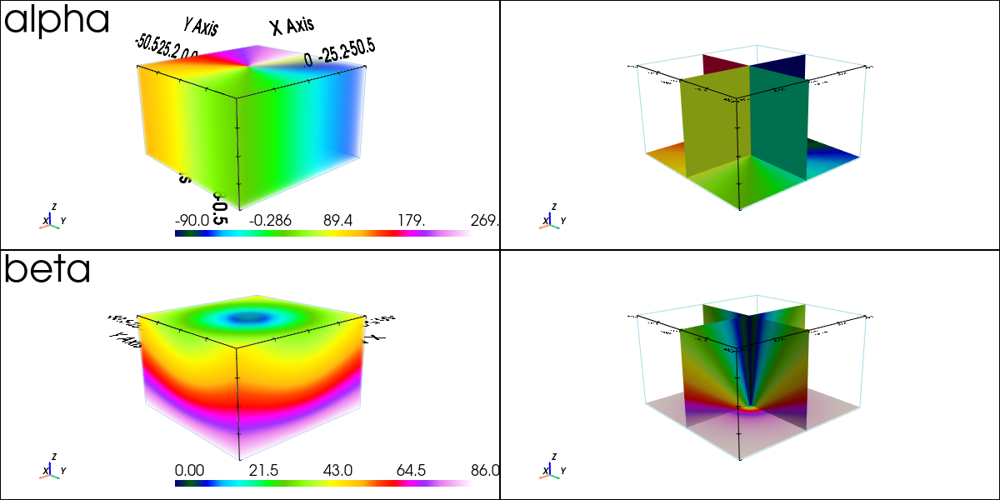

In [6]:
# Parameters for the 3D plot
lx, ly, lz = 0.5, 0.5, 0.01
slice_normal_x=(1-lx)*im.xmin()+lx*im.xmax()
slice_normal_y=(1-ly)*im.ymin()+ly*im.ymax()
slice_normal_z=(1-lz)*im.zmin()+lz*im.zmax()
cpos=[(182.74662411073137, 218.7477610548302, 123.8258100805241),
 (1.8237788203168197, 1.984870048014904, 22.292393091965078),
 (-0.23019590790627398, -0.24857231558360507, 0.9408621832705422)]
# cpos = None

# Plot "interactive in pop-up window" or "inline" (comment the undesired one) ...
# ... interactive (after closing the pop-up window, the position of the camera is retrieved in output)
#pp = pv.Plotter(shape=(1,3), notebook=False)
# ... inline
pp = pv.Plotter(shape=(2,2), window_size=[1200, 600])

pp.subplot(0, 0)
gn.imgplot3d.drawImage3D_volume(im_alpha, plotter=pp, cmap='gist_ncar', 
                                show_bounds=True, text='alpha', 
                                scalar_bar_kwargs={'title':''}) # distinct titles for distinct color scales...

pp.subplot(0, 1)
gn.imgplot3d.drawImage3D_slice(im_alpha, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap='gist_ncar', show_bounds=True, 
                               scalar_bar_kwargs={'title':''})

pp.subplot(1, 0)
gn.imgplot3d.drawImage3D_volume(im_beta, plotter=pp, cmap='gist_ncar', 
                                show_bounds=True, text='beta',
                                scalar_bar_kwargs={'title':' '}) # distinct titles for distinct color scales...

pp.subplot(1, 1)
gn.imgplot3d.drawImage3D_slice(im_beta, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap='gist_ncar', show_bounds=True, 
                               scalar_bar_kwargs={'title':' '})

pp.link_views()
pp.show(cpos=cpos)

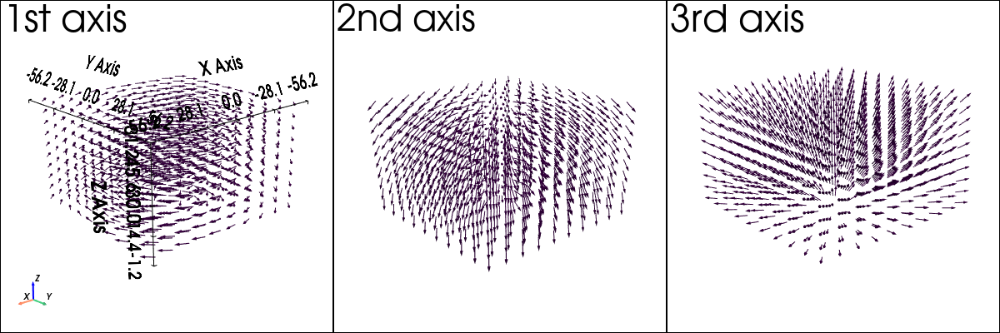

In [7]:
# Show the new x-axis, new y-axis and new z-axis of the local system according to the angles in some points of the grid
x1 = np.linspace(im.xmin(), im.xmax(), 10)
x2 = np.linspace(im.ymin(), im.ymax(), 10)
x3 = np.linspace(im.zmin(), im.zmax(), 10)

xx3, xx2, xx1 = np.meshgrid(x3, x2, x1, indexing='ij')
points = np.array((xx1.reshape(-1), xx2.reshape(-1), xx3.reshape(-1))).T
a, b, c = alpha_loc_func(points), beta_loc_func(points), gamma_loc_func(points)
mrot = np.asarray([gn.covModel.rotationMatrix3D(ai, bi, ci) for ai, bi, ci in zip(a, b, c)])
ax1 = mrot[:,:,0]
ax2 = mrot[:,:,1]
ax3 = mrot[:,:,2]

# Parameters for the 3D plot
cpos=[(220.7404216217184, 264.26796816626137, 145.14782764812148),
 (1.8237788203168197, 1.984870048014904, 22.292393091965078),
 (-0.23019590790627392, -0.248572315583605, 0.9408621832705419)]
# cpos = None

# Plot "interactive in pop-up window" or "inline" (comment the undesired one) ...
# ... interactive (after closing the pop-up window, the position of the camera is retrieved in output)
#pp = pv.Plotter(shape=(1,3), notebook=False)
# ... inline
pp = pv.Plotter(shape=(1,3), window_size=[1200, 400])

m = 8

pp.subplot(0, 0)
pp.add_arrows(points, ax1, mag=m, show_scalar_bar=False)
pp.show_bounds()
pp.add_axes()
pp.add_text('1st axis')

pp.subplot(0, 1)
pp.add_arrows(points, ax2, mag=m, show_scalar_bar=False)
#pp.show_bounds()
pp.add_text('2nd axis')

pp.subplot(0, 2)
pp.add_arrows(points, ax3, mag=m, show_scalar_bar=False)
#pp.show_bounds()
pp.add_text('3rd axis')

pp.link_views()
#cpos=pp.show(cpos=cpos, return_cpos=True) # To adjust cpos...
pp.show(cpos=cpos)



### Defining non-stationary ranges
The factor (multiplier) for range `r_factor` locally varying in the grid is defined as `im_r_factor`: an image (with one variable on the grid).

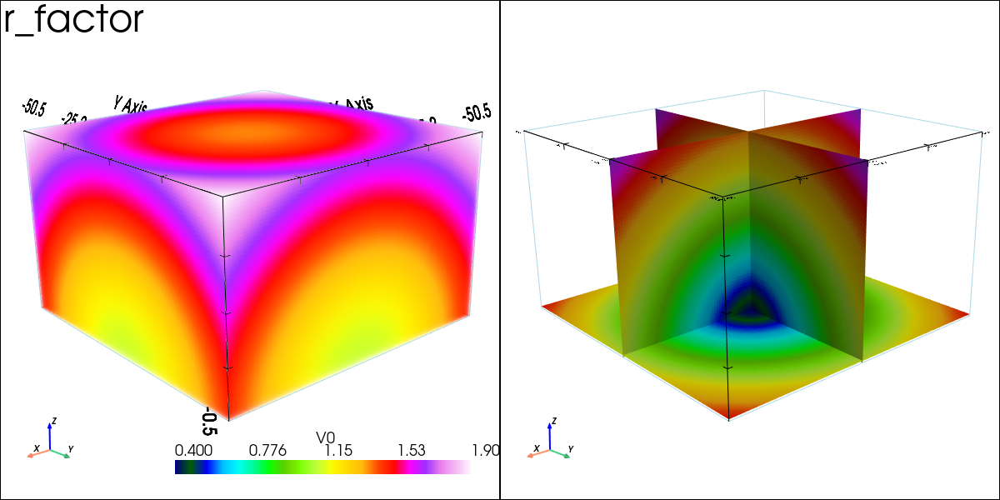

In [8]:
# Set the range factor as function of the distance to c0 (defined above) as follows
d0, d1 = im.zmax() - c0[2], - c0[2]
r0, r1 = 1.4, 0.4 # value for distance equal to d0, d1

d = cells_center - c0
d = np.sqrt(np.sum(d**2, axis=1))
r = r0 + (d-d0)/(d1-d0) * (r1-r0)

im_r_factor = gn.img.Img(nx, ny, nz, sx, sy, sz, ox, oy, oz, nv=1, val=r)

# Parameters for the 3D plot
lx, ly, lz = 0.5, 0.5, 0.01
slice_normal_x=(1-lx)*im.xmin()+lx*im.xmax()
slice_normal_y=(1-ly)*im.ymin()+ly*im.ymax()
slice_normal_z=(1-lz)*im.zmin()+lz*im.zmax()
cpos=[(182.74662411073137, 218.7477610548302, 123.8258100805241),
 (1.8237788203168197, 1.984870048014904, 22.292393091965078),
 (-0.23019590790627398, -0.24857231558360507, 0.9408621832705422)]
# cpos = None

# Plot "interactive in pop-up window" or "inline" (comment the undesired one) ...
# ... interactive (after closing the pop-up window, the position of the camera is retrieved in output)
#pp = pv.Plotter(shape=(1,3), notebook=False)
# ... inline
pp = pv.Plotter(shape=(1,2), window_size=[1200, 600])

pp.subplot(0, 0)
gn.imgplot3d.drawImage3D_volume(im_r_factor, plotter=pp, cmap='gist_ncar', show_bounds=True, text='r_factor')

pp.subplot(0, 1)
gn.imgplot3d.drawImage3D_slice(im_r_factor, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap='gist_ncar', show_bounds=True)

pp.link_views()
pp.show(cpos=cpos)

### Defining non-stationary variance (sill)
The factor (multiplier) for the total weight (variance, sill) `w_factor` locally varying in the grid is defined as `im_w_factor`: an image (with one variable on the grid).

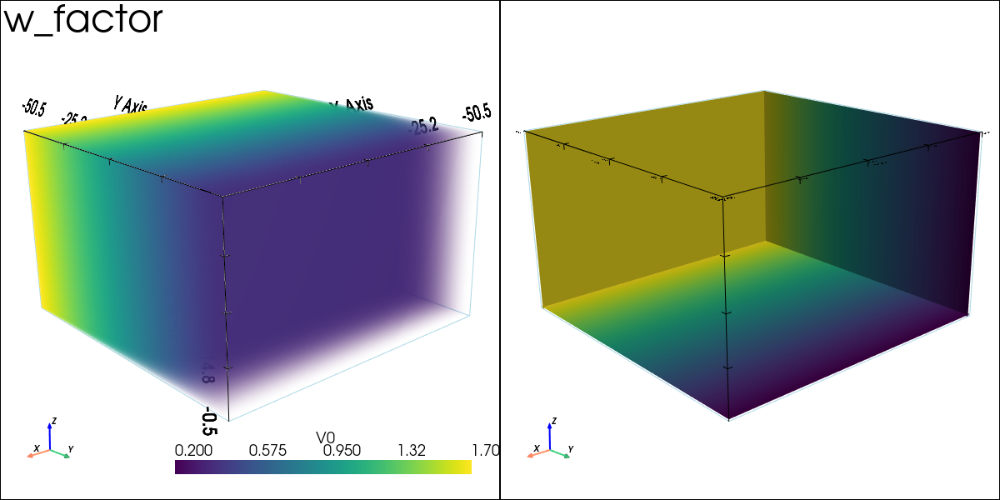

In [9]:
# Set the weight decreasing linearly along the y-axis
w0 = 1.7 # for y min
w1 = 0.2 # minimal value

# "Empty" image
im_w_factor = gn.img.Img(nx, ny, nz, sx, sy, sz, ox, oy, oz, nv=0)

# Add variable
w = w0 + (im_w_factor.yy()-im_w_factor.yy().min())/(im_w_factor.yy().max()-im_w_factor.yy().min()) * (w1-w0)
im_w_factor.append_var(w)

# Parameters for the 3D plot
lx, ly, lz = 0.01, 0.01, 0.01
slice_normal_x=(1-lx)*im.xmin()+lx*im.xmax()
slice_normal_y=(1-ly)*im.ymin()+ly*im.ymax()
slice_normal_z=(1-lz)*im.zmin()+lz*im.zmax()
# cpos=[(182.74662411073137, 218.7477610548302, 123.8258100805241),
#  (1.8237788203168197, 1.984870048014904, 22.292393091965078),
#  (-0.23019590790627398, -0.24857231558360507, 0.9408621832705422)]
# cpos = None

# Plot "interactive in pop-up window" or "inline" (comment the undesired one) ...
# ... interactive (after closing the pop-up window, the position of the camera is retrieved in output)
#pp = pv.Plotter(shape=(1,3), notebook=False)
# ... inline
pp = pv.Plotter(shape=(1,2), window_size=[1200, 600])

pp.subplot(0, 0)
gn.imgplot3d.drawImage3D_volume(im_w_factor, plotter=pp, cmap='viridis', show_bounds=True, text='w_factor')

pp.subplot(0, 1)
gn.imgplot3d.drawImage3D_slice(im_w_factor, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap='viridis', show_bounds=True)

pp.link_views()
pp.show(cpos=cpos)

# # Plot "interactive in pop-up window" or "inline" (comment the undesired one) ...
# # ... interactive (after closing the pop-up window, the position of the camera is retrieved in output)
# #pp = pv.Plotter(notebook=False)
# # ... inline
# pp = pv.Plotter()
# gn.imgplot3d.drawImage3D_volume(im_w_factor, plotter=pp, show_bounds=True, text='w_factor')
# pp.show(cpos=cpos)

## II Non-stationary simulations
First define a reference covariance model and generate an unconditional simulation (reference). Then build a data set by extract some points from the simulation. Then, ignoring the covariance model and starting from the data set and the maps controlling the non-stationary features:

- fit a covariance model
- do kriging / conditional simulations

Several cases are proposed below with different non-stationary features.

## A. Non-stationary orientation

### Reference covariance model and non-stationarity
Define first a *stationary* anisotropic reference covariance model in 3D. Then, add the desired non-stationarity feature.

In [10]:
# Define a base covariance model (stationary)
cov_model_base = gn.covModel.CovModel3D(elem=[
    ('cubic', {'w':10, 'r':[24., 12., 6.]}), # elementary contribution
    ], alpha=0.0, beta=0.0, gamma=0.0, name='ref')

# Define the functions `alpha_loc_func`, (resp. `alpha_loc_func_xyz`) and that returns the angle(s) 
# alpha at given location(s) from one parameter: point(s) in 3D (resp. three parameters: x, y, z coordinate(s))
alpha_loc_func = gn.img.Img_interp_func(im_alpha, ind=0, angle_var=True)

def alpha_loc_func_xyz(x, y, z):
    x = np.atleast_1d(x)
    y = np.atleast_1d(y)
    z = np.atleast_1d(z)
    return alpha_loc_func(np.vstack((x.reshape(-1), y.reshape(-1), y.reshape(-1))).T).reshape(x.shape)

# Do the same for angle beta
beta_loc_func = gn.img.Img_interp_func(im_beta, ind=0)

def beta_loc_func_xyz(x, y, z):
    x = np.atleast_1d(x)
    y = np.atleast_1d(y)
    z = np.atleast_1d(z)
    return beta_loc_func(np.vstack((x.reshape(-1), y.reshape(-1), y.reshape(-1))).T).reshape(x.shape)

# Do the same for angle gamma
gamma_loc_func = gn.img.Img_interp_func(im_gamma, ind=0)

def gamma_loc_func_xyz(x, y, z):
    x = np.atleast_1d(x)
    y = np.atleast_1d(y)
    z = np.atleast_1d(z)
    return gamma_loc_func(np.vstack((x.reshape(-1), y.reshape(-1), y.reshape(-1))).T).reshape(x.shape)

# These functions will be used to set non-stationary orientation (see below)

### Do an unconditional simulation (reference)

In [11]:
# Simulation
nreal = 1
np.random.seed(32)
geosclassic_output = gn.geosclassicinterface.simulate(
                        cov_model_base, (nx, ny, nz), (sx, sy, sz), (ox, oy, oz), 
                        method='simple_kriging',
                        alpha=alpha_loc_func_xyz,
                        beta=beta_loc_func_xyz,
                        gamma=gamma_loc_func_xyz,
                        nneighborMax=20, 
                        nreal=nreal, 
                        nproc=1, nthreads_per_proc=8)

im_ref = geosclassic_output['image']

simulate: Preprocessing data done: final number of data points : 0, inequality data points: 0
simulate: Computational resources: nproc = 1, nthreads_per_proc = 8, nproc_sgs_at_ineq = 8
simulate: (Step 1-3 skipped) No data
simulate: (Step 4) Do sgs (1 realizations) on the grid (at cell centers) using data points at cell centers...
simulate: Geos-Classic running on 1 process... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 8 thread(s)]
run_MPDSOMPGeosClassicSim: Geos-Classic running... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 8 thread(s)]
run_MPDSOMPGeosClassicSim: Geos-Classic run complete
simulate: Geos-Classic (1 process) run complete
simulate: warnings encountered (105 times in all):
#  1: WARNING 02001: a neigbhor has been dropped (solving kriging system)


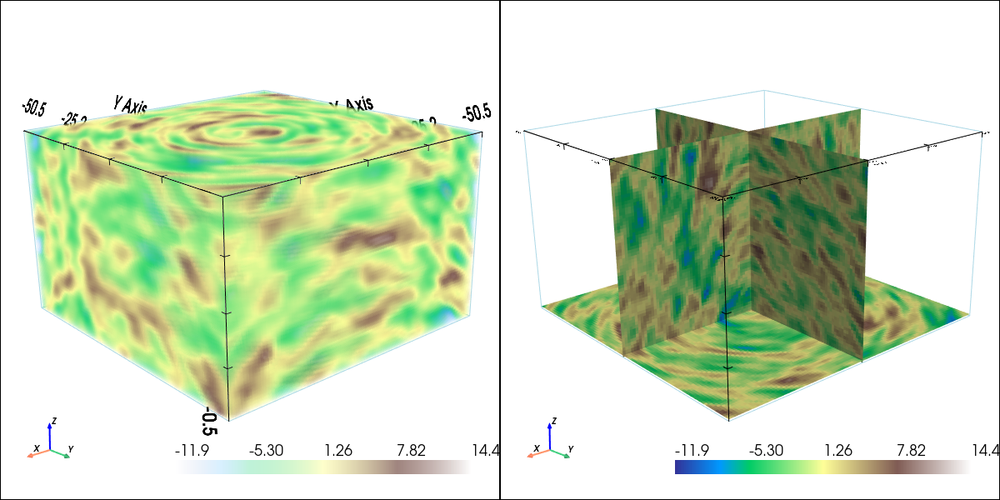

In [12]:
# Parameters for the 3D plot
lx, ly, lz = 0.5, 0.5, 0.01
slice_normal_x=(1-lx)*im.xmin()+lx*im.xmax()
slice_normal_y=(1-ly)*im.ymin()+ly*im.ymax()
slice_normal_z=(1-lz)*im.zmin()+lz*im.zmax()
# cpos=[(182.74662411073137, 218.7477610548302, 123.8258100805241),
#  (1.8237788203168197, 1.984870048014904, 22.292393091965078),
#  (-0.23019590790627398, -0.24857231558360507, 0.9408621832705422)]
# cpos = None

# Color settings
cmap = 'terrain'

cmin = im_ref.vmin()[0] # min value in ref
cmax = im_ref.vmax()[0] # max value in ref

# Plot "interactive in pop-up window" or "inline" (comment the undesired one) ...
# ... interactive (after closing the pop-up window, the position of the camera is retrieved in output)
#pp = pv.Plotter(shape=(1,3), notebook=False)
# ... inline
pp = pv.Plotter(shape=(1,2), window_size=[1200, 600])

pp.subplot(0, 0)
gn.imgplot3d.drawImage3D_volume(im_ref, plotter=pp, 
                                cmap=cmap, cmin=cmin, cmax=cmax, 
                                show_bounds=True, scalar_bar_kwargs={'title':''})

pp.subplot(0, 1)
gn.imgplot3d.drawImage3D_slice(im_ref, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap=cmap, cmin=cmin, cmax=cmax, 
                               show_bounds=True, scalar_bar_kwargs={'title':' '})

pp.link_views()
pp.show(cpos=cpos)

### Build a non-stationary data set (3D)

The data set is defined by extracting some points from the simulation of reference.

*Note:* the data set should contain enough points to catch the non-stationarities.

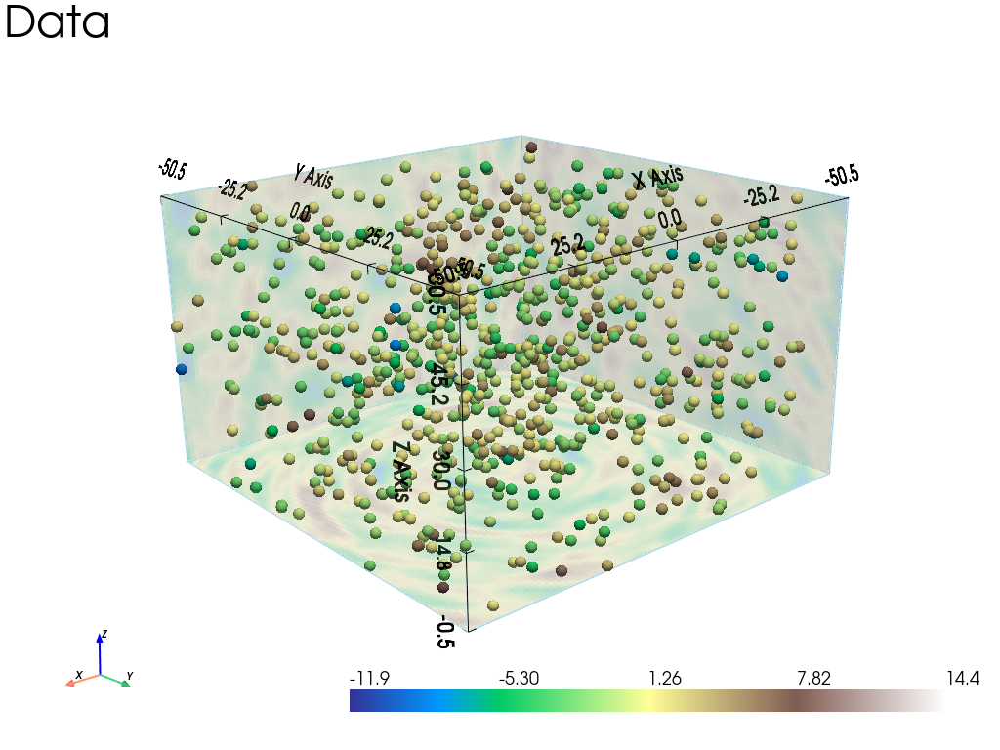

In [13]:
# Extract some points from the simulation
n = 780

# --- Choose 1. or 2. below ---
# # 1. Sampling the image
# ps = gn.img.sampleFromImage(im_ref, n, seed=234)
# # Data points and data value
# x = np.array((ps.x(), ps.y(), ps.z())).T
# v = ps.val[3]
# # Optionally: move points in the grid cells randomly, and add noise to values
# x[:, 0] = x[:, 0] + (np.random.random(n)-0.5)* im_ref.sx
# x[:, 1] = x[:, 1] + (np.random.random(n)-0.5)* im_ref.sy
# x[:, 2] = x[:, 2] + (np.random.random(n)-0.5)* im_ref.sz
# v = v + (np.random.random(n)-0.5)* 1.e-1

# 2. Using the function interpolating the image values
f = gn.img.Img_interp_func(im_ref)
np.random.seed(328)
x1 = im_ref.xmin() + np.random.random(n) * (im_ref.xmax()-im_ref.xmin())
x2 = im_ref.ymin() + np.random.random(n) * (im_ref.ymax()-im_ref.ymin())
x3 = im_ref.zmin() + np.random.random(n) * (im_ref.zmax()-im_ref.zmin())
x = np.array((x1, x2, x3)).T
v = f(x)
# ----- #

# Parameters for the 3D plot
# Color settings
cmap = 'terrain'

cmin = im_ref.vmin()[0] # min value in ref
cmax = im_ref.vmax()[0] # max value in ref

# Get colors for conditioning data according to their value and color settings
data_points_col = gn.imgplot.get_colors_from_values(v, cmap=cmap, cmin=cmin, cmax=cmax) 

# Set points to be plotted
data_points = pv.PolyData(x)
data_points['colors'] = data_points_col

# Plot "interactive in pop-up window" or "inline" (comment the undesired one) ...
# ... interactive (after closing the pop-up window, the position of the camera is retrieved in output)
#pp = pv.Plotter(shape=(1,3), notebook=False)
# ... inline
pp = pv.Plotter()

gn.imgplot3d.drawImage3D_slice(im_ref, plotter=pp, 
                               slice_normal_x=im_ref.xmin()+.01,
                               slice_normal_y=im_ref.ymin()+.01,
                               slice_normal_z=im_ref.zmin()+.01,
                               cmap=cmap, cmin=cmin, cmax=cmax, opacity=.3,
                               scalar_bar_kwargs={'vertical':False, 'title':'', 'title_font_size':18},
                               show_bounds=True)

pp.add_mesh(data_points, rgb=True, point_size=12., render_points_as_spheres=True)
pp.add_mesh(data_points.outline())
pp.show_bounds()
pp.add_text('Data')

pp.show(cpos=cpos)

### Simulation starting from a non-stationary data set in 3D and assuming "non-stationarity feature(s)" known

- `n`: number of data points
- `x`: location of data points (2-dimensional array of shape `(n, 3)`, each row is a point)
- `v`: values at data points (1-dimensional array of length `n`)
- `im_alpha`, `im_beta`, `im_gamma`: images of the angle `alpha`, `beta`, `gamma` in the grid, determining the local orientation of the covariance model; the functions `alpha_loc_func`, `beta_loc_func`, `gamma_loc_func` (resp. `alpha_loc_func_xyz`, `beta_loc_func_xyz`, `gamma_loc_func_xyz`) which are interpolators in the grid taking one parameter, points in 3D (resp. three parameters, the x, y and z coordinates of points in 3D)

### Fitting covariance model accounting for non-stationarity

In [14]:
cov_model_to_optimize = gn.covModel.CovModel3D(elem=[
        ('cubic', {'w':np.nan, 'r':[np.nan, np.nan, np.nan]}), # elementary contribution
         ], alpha=0.0, beta=0.0, gamma=0.0, name='') # angles are set to 0.0, non-sationarity is handled by *_loc_func below

t1 = time.time()
cov_model_opt, popt = gn.covModel.covModel3D_fit(x, v, cov_model_to_optimize, 
                alpha_loc_func=alpha_loc_func, # deal with non-stationarity (orientation)
                beta_loc_func=beta_loc_func, 
                gamma_loc_func=gamma_loc_func,
                loc_m=10, # loc_m > 0: number of sub-intervals btw pair of points to estimate local factor (default 1)
                          # loc_m = 0: take factor from one point
                bounds=([ 0,  0,  0,  0],  # min value for param. to fit
                        [40, 50, 50, 50]), # max value for param. to fit
                hmax=None, make_plot=False) # figure size for plot
t2 = time.time()
print(f'Fitting covariance model - elapsed time: {t2-t1:.4g} sec')

cov_model_opt

Fitting covariance model - elapsed time: 9.64 sec


*** CovModel3D object ***
name = ''
number of elementary contribution(s): 1
elementary contribution 0
    type: cubic
    parameters:
        w = 8.105692055481814
        r = [np.float64(33.0058482230254), np.float64(11.515204803781971), np.float64(9.687061385358797)]
angles: alpha = 0.0, beta = 0.0, gamma = 0.0 (in degrees)
    i.e.: the system Ox'''y''''z''', supporting the axes of the model (ranges),
    is obtained from the system Oxyz as follows:
        Oxyz      -- rotation of angle -alpha around Oz  --> Ox'y'z'
        Ox'y'z'   -- rotation of angle -beta  around Ox' --> Ox''y''z''
        Ox''y''z''-- rotation of angle -gamma around Oy''--> Ox'''y'''z'''
*****

#### Cross-validation by leave-one-out error

----- CRPS (negative; the larger, the better) -----
   mean = -1.447
   def. = -0.6641
----- 1) "Normal law test for mean of normalized error" -----
   p-value = 0.8138
   success = True (wrt significance level 0.05)
      (-> model has no reason to be rejected)
----- 2) "Chi-square test for sum of squares of normalized error" -----
   p-value = 0
   success = False (wrt significance level 0.05)
      -> model should be REJECTED
----- Statistics of normalized error -----
   mean     = -0.008433 (should be close to 0)
   std      = 1.254 (should be close to 1)
   skewness = 0.03435 (should be close to 0)
   excess kurtosis = 0.235 (should be close to 0)


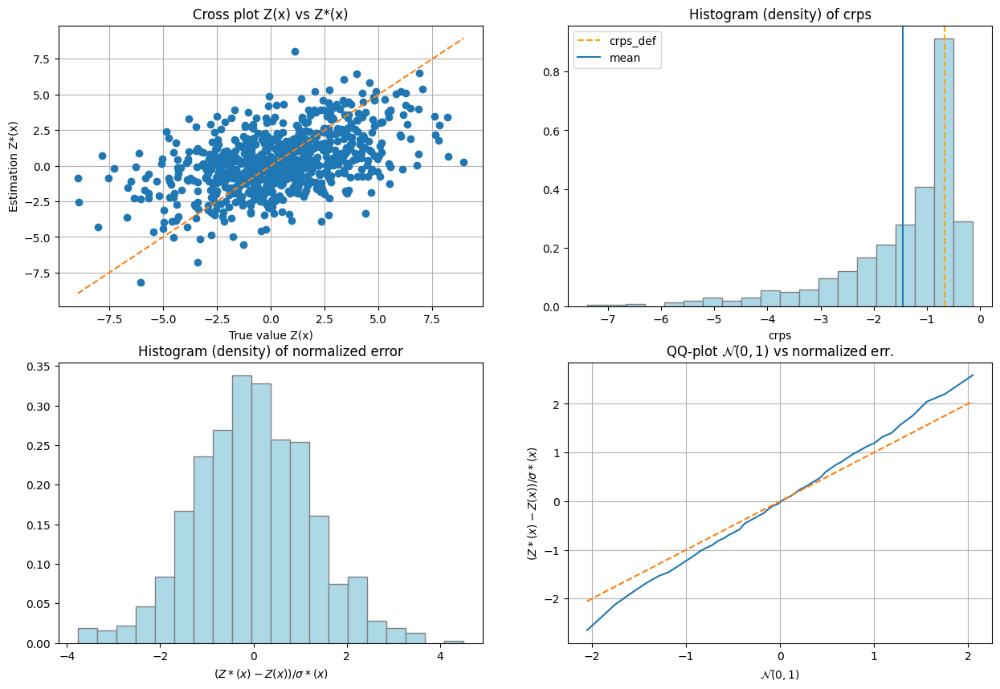

In [15]:
# Interpolation by simple kriging
cv_est1, cv_std1, crps1, crps_def1, pvalue1, success1 = gn.covModel.cross_valid_loo(
                                        x, v, cov_model_opt,
                                        interpolator=gn.covModel.krige, 
                                        interpolator_kwargs={'method':'ordinary_kriging'},
                                        alpha_x=alpha_loc_func(x), # specify angle at data points
                                        beta_x=beta_loc_func(x), # specify angle at data points
                                        gamma_x=gamma_loc_func(x), # specify angle at data points
                                        print_result=True, make_plot=True, figsize=(15,10), nbins=20)
plt.show()

### Show experimental variogram, fitted model and reference model

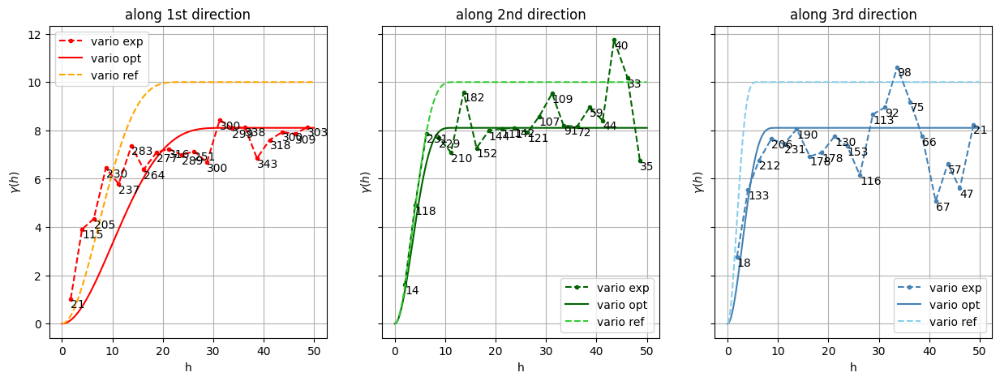

In [16]:
hmax1, hmax2, hmax3 = 50.0, 50.0, 50.0

(hexp1, gexp1, cexp1), (hexp2, gexp2, cexp2), (hexp3, gexp3, cexp3) = gn.covModel.variogramExp3D(
                x, v, alpha=0, beta=0, gamma=0, hmax=(hmax1, hmax2, hmax3),
                alpha_loc_func=alpha_loc_func, beta_loc_func=beta_loc_func, gamma_loc_func=gamma_loc_func, loc_m=10,
                ncla=(20, 20, 20), make_plot=False)

plt.subplots(1,3, sharey=True, figsize=(15,5))
plt.subplot(1,3,1)
gn.covModel.plot_variogramExp1D(hexp1, gexp1, cexp1, c='red', label='vario exp')
cov_model_opt.plot_model_one_curve(vario=True, main_axis=1, hmax=hmax1, c='red', label='vario opt')
cov_model_base.plot_model_one_curve(vario=True, main_axis=1, hmax=hmax1, c='orange', ls='dashed', label='vario ref')
plt.legend()
plt.title("along 1st direction")

plt.subplot(1,3,2)
gn.covModel.plot_variogramExp1D(hexp2, gexp2, cexp2, c='darkgreen', label='vario exp')
cov_model_opt.plot_model_one_curve(vario=True, main_axis=2, hmax=hmax2, c='darkgreen', label='vario opt')
cov_model_base.plot_model_one_curve(vario=True, main_axis=2, hmax=hmax2, c='limegreen', ls='dashed', label='vario ref')
plt.legend()
plt.title("along 2nd direction")

plt.subplot(1,3,3)
gn.covModel.plot_variogramExp1D(hexp3, gexp3, cexp3, c='steelblue', label='vario exp')
cov_model_opt.plot_model_one_curve(vario=True, main_axis=3, hmax=hmax3, c='steelblue', label='vario opt')
cov_model_base.plot_model_one_curve(vario=True, main_axis=3, hmax=hmax3, c='skyblue', ls='dashed', label='vario ref')
plt.legend()
plt.title("along 3rd direction")

plt.show()

### Kriging and conditional simulations

In [17]:
# Kriging
t1 = time.time() # start time
geosclassic_output = gn.geosclassicinterface.estimate(
                            cov_model_opt, (nx, ny, nz), (sx, sy, sz), (ox, oy, oz), 
                            x=x, v=v, 
                            method='simple_kriging', 
                            nneighborMax=20,
                            alpha=alpha_loc_func_xyz,
                            beta=beta_loc_func_xyz,
                            gamma=gamma_loc_func_xyz,
                            nthreads=8)
t2 = time.time() # end time
print(f'Kriging - elapsed time: {t2-t1:.4g} sec')

# Retrieve kriging estimate and standard deviation
im_krig = geosclassic_output['image']

estimate: Preprocessing data done: final number of data points : 780, inequality data points: 0
estimate: Computational resources: nthreads = 8, nproc_sgs_at_ineq = 8
estimate: (Step 1) No inequality data
estimate: (Step 2) Set new dataset gathering data and inequality data locations...
estimate: (Step 3) Do kriging at the center of grid cells containing at least one data point...
estimate: (Step 4) Do kriging on the grid (at cell centers) using data points at cell centers...
estimate: Geos-Classic running on 1 process... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 8 thread(s)]
run_MPDSOMPGeosClassicSim: Geos-Classic running... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 8 thread(s)]
run_MPDSOMPGeosClassicSim: Geos-Classic run complete
estimate: Geos-Classic (1 process) run complete
estimate: warnings encountered (2092 times in all):
#  1: WARNING 02001: a neigbhor has been dropped (solving kriging system)
#  2: WARNING 02015: solving kriging system fails (do as if no neighbor)
Kri

In [18]:
# Simulation
nreal = 4
np.random.seed(22131)
t1 = time.time() # start time
geosclassic_output = gn.geosclassicinterface.simulate(
                            cov_model_opt, (nx, ny, nz), (sx, sy, sz), (ox, oy, oz), 
                            x=x, v=v, method='simple_kriging', 
                            nneighborMax=20,
                            alpha=alpha_loc_func_xyz,
                            beta=beta_loc_func_xyz,
                            gamma=gamma_loc_func_xyz,
                            nreal=nreal,
                            nproc=4, nthreads_per_proc=4)
t2 = time.time() # end time
print(f'{nreal} simul. - elapsed time: {t2-t1:.4g} sec')

# Retrieve the realizations
simul = geosclassic_output['image']

# Compute mean and standard deviation (pixel-wise)
simul_mean = gn.img.imageContStat(simul, op='mean')
simul_std = gn.img.imageContStat(simul, op='std')

simulate: Preprocessing data done: final number of data points : 780, inequality data points: 0
simulate: Computational resources: nproc = 4, nthreads_per_proc = 4, nproc_sgs_at_ineq = 16
simulate: (Step 1) No inequality data
simulate: (Step 2) Set new dataset gathering data and inequality data locations...
simulate: (Step 3) Do kriging at the center of grid cells containing at least one data point...
simulate: (Step 4) Do sgs (4 realizations) on the grid (at cell centers) using data points at cell centers...
simulate: Geos-Classic running on 4 process(es)... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 4 thread(s)]
run_MPDSOMPGeosClassicSim [pid=0]: Geos-Classic running... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 4 thread(s)]
run_MPDSOMPGeosClassicSim [pid=0]: Geos-Classic run complete
simulate: Geos-Classic (4 process(es)) run complete
4 simul. - elapsed time: 4.9 sec


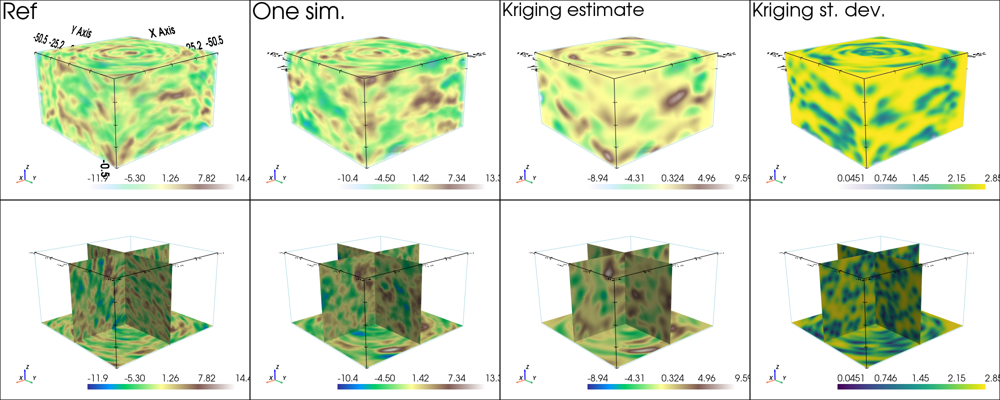

In [19]:
# Parameters for the 3D plot
lx, ly, lz = 0.5, 0.5, 0.01
slice_normal_x=(1-lx)*im.xmin()+lx*im.xmax()
slice_normal_y=(1-ly)*im.ymin()+ly*im.ymax()
slice_normal_z=(1-lz)*im.zmin()+lz*im.zmax()
# cpos=[(182.74662411073137, 218.7477610548302, 123.8258100805241),
#  (1.8237788203168197, 1.984870048014904, 22.292393091965078),
#  (-0.23019590790627398, -0.24857231558360507, 0.9408621832705422)]
# cpos = None

# Color settings
cmap = 'terrain'

# Plot "interactive in pop-up window" or "inline" (comment the undesired one) ...
# ... interactive (after closing the pop-up window, the position of the camera is retrieved in output)
#pp = pv.Plotter(shape=(3,2), notebook=False)
# ... inline
pp = pv.Plotter(shape=(2,4), window_size=[2000, 800])

cmin = im_ref.vmin()[0] # min value in ref
cmax = im_ref.vmax()[0] # max value in ref

pp.subplot(0, 0)
gn.imgplot3d.drawImage3D_volume(im_ref, plotter=pp, 
                                cmap=cmap, cmin=cmin, cmax=cmax, 
                                show_bounds=True, scalar_bar_kwargs={'title':1*' '}, # distinct titles for distinct color scales...
                                text='Ref')

pp.subplot(1, 0)
gn.imgplot3d.drawImage3D_slice(im_ref, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap=cmap, cmin=cmin, cmax=cmax, 
                               show_bounds=True, scalar_bar_kwargs={'title':2*' '})

i = 0 # realization index
cmin = simul.vmin()[i] # min value in simul #i
cmax = simul.vmax()[i] # max value in simul #i

pp.subplot(0, 1)
gn.imgplot3d.drawImage3D_volume(simul, iv=i, plotter=pp, 
                                cmap=cmap, cmin=cmin, cmax=cmax, 
                                show_bounds=True, scalar_bar_kwargs={'title':3*' '},
                                text='One sim.')

pp.subplot(1, 1)
gn.imgplot3d.drawImage3D_slice(simul, iv=i, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap=cmap, cmin=cmin, cmax=cmax, 
                               show_bounds=True, scalar_bar_kwargs={'title':4*' '})


cmin = im_krig.vmin()[0]
cmax = im_krig.vmax()[0]

pp.subplot(0, 2)
gn.imgplot3d.drawImage3D_volume(im_krig, iv=0, plotter=pp, 
                                cmap=cmap, cmin=cmin, cmax=cmax, 
                                show_bounds=True, scalar_bar_kwargs={'title':5*' '},
                                text='Kriging estimate')

pp.subplot(1, 2)
gn.imgplot3d.drawImage3D_slice(im_krig, iv=0, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap=cmap, cmin=cmin, cmax=cmax, 
                               show_bounds=True, scalar_bar_kwargs={'title':6*' '})


cmin = im_krig.vmin()[1]
cmax = im_krig.vmax()[1]

pp.subplot(0, 3)
gn.imgplot3d.drawImage3D_volume(im_krig, iv=1, plotter=pp, 
                                cmap='viridis', cmin=cmin, cmax=cmax, 
                                show_bounds=True, scalar_bar_kwargs={'title':7*' '},
                                text='Kriging st. dev.')

pp.subplot(1, 3)
gn.imgplot3d.drawImage3D_slice(im_krig, iv=1, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap='viridis', cmin=cmin, cmax=cmax, 
                               show_bounds=True, scalar_bar_kwargs={'title':8*' '})

pp.link_views()
pp.show(cpos=cpos)

## B. Non-stationary range (along each axis)

### Reference covariance model and non-stationarity
Define first a *stationary* anisotropic reference covariance model in 3D. Then, add the desired non-stationarity feature.

In [20]:
# Define a base covariance model (stationary)
cov_model_base = gn.covModel.CovModel3D(elem=[
    ('cubic', {'w':10, 'r':[24., 12., 6.]}), # elementary contribution
    ], alpha=0.0, beta=0.0, gamma=0.0, name='ref')

# Set list to handle non-stationarities
cov_model_non_stationarity_list = [
    ('multiply_r', im_r_factor.val[0]), # multiply range by `im_r_factor.val[0]` over the grid
]


### Do an unconditional simulation (reference)

In [21]:
# Simulation
nreal = 1
np.random.seed(684)
geosclassic_output = gn.geosclassicinterface.simulate(
                            cov_model_base, (nx, ny, nz), (sx, sy, sz), (ox, oy, oz), 
                            method='simple_kriging', 
                            cov_model_non_stationarity_list=cov_model_non_stationarity_list,
                            nneighborMax=20, 
                            nreal=nreal, 
                            nproc=1, nthreads_per_proc=8)

im_ref = geosclassic_output['image']

simulate: Preprocessing data done: final number of data points : 0, inequality data points: 0
simulate: Computational resources: nproc = 1, nthreads_per_proc = 8, nproc_sgs_at_ineq = 8
simulate: (Step 1-3 skipped) No data
simulate: (Step 4) Do sgs (1 realizations) on the grid (at cell centers) using data points at cell centers...
simulate: Geos-Classic running on 1 process... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 8 thread(s)]
run_MPDSOMPGeosClassicSim: Geos-Classic running... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 8 thread(s)]
run_MPDSOMPGeosClassicSim: Geos-Classic run complete
simulate: Geos-Classic (1 process) run complete
simulate: warnings encountered (108 times in all):
#  1: WARNING 02001: a neigbhor has been dropped (solving kriging system)


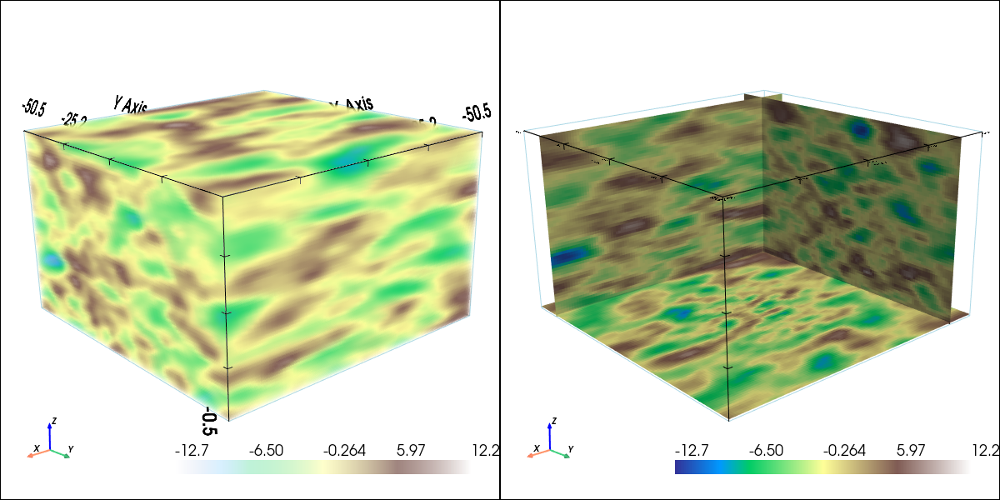

In [22]:
# Parameters for the 3D plot
lx, ly, lz = 0.1, 0.1, 0.01
slice_normal_x=(1-lx)*im.xmin()+lx*im.xmax()
slice_normal_y=(1-ly)*im.ymin()+ly*im.ymax()
slice_normal_z=(1-lz)*im.zmin()+lz*im.zmax()
# cpos=[(182.74662411073137, 218.7477610548302, 123.8258100805241),
#  (1.8237788203168197, 1.984870048014904, 22.292393091965078),
#  (-0.23019590790627398, -0.24857231558360507, 0.9408621832705422)]
# cpos = None

# Color settings
cmap = 'terrain'

cmin = im_ref.vmin()[0] # min value in ref
cmax = im_ref.vmax()[0] # max value in ref

# Plot "interactive in pop-up window" or "inline" (comment the undesired one) ...
# ... interactive (after closing the pop-up window, the position of the camera is retrieved in output)
#pp = pv.Plotter(shape=(1,3), notebook=False)
# ... inline
pp = pv.Plotter(shape=(1,2), window_size=[1200, 600])

pp.subplot(0, 0)
gn.imgplot3d.drawImage3D_volume(im_ref, plotter=pp, 
                                cmap=cmap, cmin=cmin, cmax=cmax, 
                                show_bounds=True, scalar_bar_kwargs={'title':''})

pp.subplot(0, 1)
gn.imgplot3d.drawImage3D_slice(im_ref, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap=cmap, cmin=cmin, cmax=cmax, 
                               show_bounds=True, scalar_bar_kwargs={'title':' '})

pp.link_views()
pp.show(cpos=cpos)

### Build a non-stationary data set (3D)

The data set is defined by extracting some points from the simulation of reference.

*Note:* the data set should contain enough points to catch the non-stationarities.

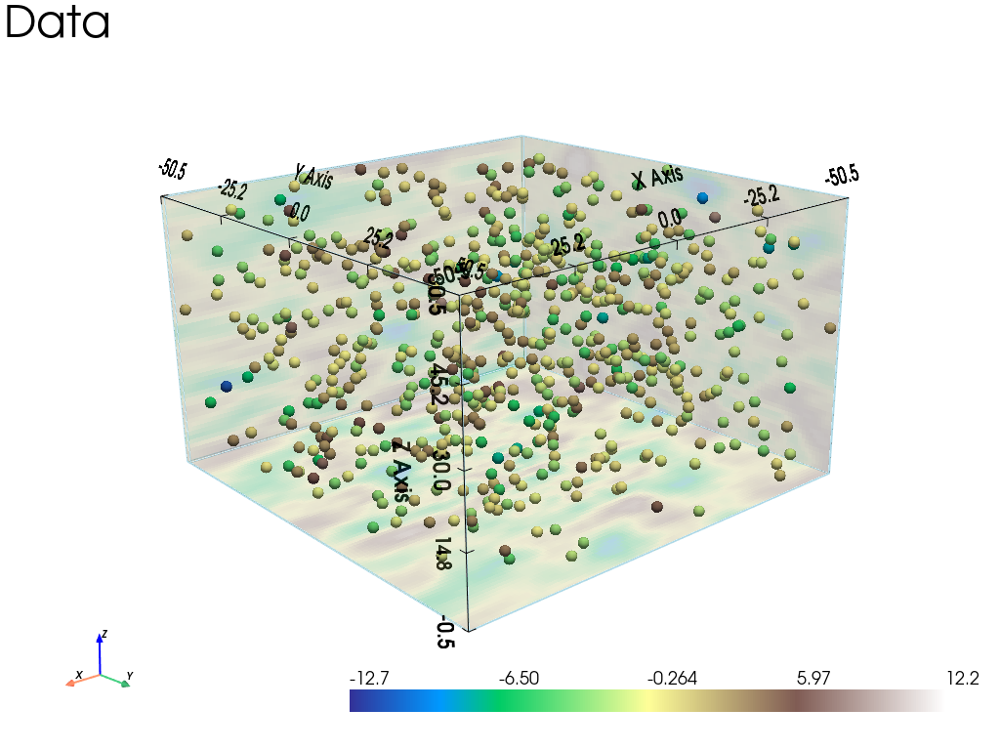

In [23]:
# Extract some points from the simulation
n = 650

# --- Choose 1. or 2. below ---
# # 1. Sampling the image
# ps = gn.img.sampleFromImage(im_ref, n, seed=234)
# # Data points and data value
# x = np.array((ps.x(), ps.y(), ps.z())).T
# v = ps.val[3]
# # Optionally: move points in the grid cells randomly, and add noise to values
# x[:, 0] = x[:, 0] + (np.random.random(n)-0.5)* im_ref.sx
# x[:, 1] = x[:, 1] + (np.random.random(n)-0.5)* im_ref.sy
# x[:, 2] = x[:, 2] + (np.random.random(n)-0.5)* im_ref.sz
# v = v + (np.random.random(n)-0.5)* 1.e-1

# 2. Using the function interpolating the image values
f = gn.img.Img_interp_func(im_ref)
np.random.seed(8837)
x1 = im_ref.xmin() + np.random.random(n) * (im_ref.xmax()-im_ref.xmin())
x2 = im_ref.ymin() + np.random.random(n) * (im_ref.ymax()-im_ref.ymin())
x3 = im_ref.zmin() + np.random.random(n) * (im_ref.zmax()-im_ref.zmin())
x = np.array((x1, x2, x3)).T
v = f(x)
# ----- #

# Parameters for the 3D plot
# Color settings
cmap = 'terrain'

cmin = im_ref.vmin()[0] # min value in ref
cmax = im_ref.vmax()[0] # max value in ref

# Get colors for conditioning data according to their value and color settings
data_points_col = gn.imgplot.get_colors_from_values(v, cmap=cmap, cmin=cmin, cmax=cmax) 

# Set points to be plotted
data_points = pv.PolyData(x)
data_points['colors'] = data_points_col

# Plot "interactive in pop-up window" or "inline" (comment the undesired one) ...
# ... interactive (after closing the pop-up window, the position of the camera is retrieved in output)
#pp = pv.Plotter(shape=(1,3), notebook=False)
# ... inline
pp = pv.Plotter()

gn.imgplot3d.drawImage3D_slice(im_ref, plotter=pp, 
                               slice_normal_x=im_ref.xmin()+.01,
                               slice_normal_y=im_ref.ymin()+.01,
                               slice_normal_z=im_ref.zmin()+.01,
                               cmap=cmap, cmin=cmin, cmax=cmax, opacity=.3,
                               scalar_bar_kwargs={'vertical':False, 'title':'', 'title_font_size':18},
                               show_bounds=True)

pp.add_mesh(data_points, rgb=True, point_size=12., render_points_as_spheres=True)
pp.add_mesh(data_points.outline())
pp.show_bounds()
pp.add_text('Data')

pp.show(cpos=cpos)

### Simulation starting from a non-stationary data set in 3D and assuming "non-stationarity feature(s)" known

- `n`: number of data points
- `x`: location of data points (2-dimensional array of shape `(n, 3)`, each row is a point)
- `v`: values at data points (1-dimensional array of length `n`)
- `im_r_factor`: image of the factor (multiplier) `r_factor` in the grid; the function `r_factor_inv_loc_func` (interpolator of the inverse of `r_factor` in the grid) is built from this image

In [24]:
# Set a function interpolating the inverse of the r_factor (given location)
im_tmp = gn.img.copyImg(im_r_factor)
im_tmp.val = 1.0/im_tmp.val
r_factor_inv_loc_func = gn.img.Img_interp_func(im_tmp, ind=0)

### Fitting covariance model accounting for non-stationarity

In [25]:
cov_model_to_optimize = gn.covModel.CovModel3D(elem=[
        ('cubic', {'w':np.nan, 'r':[np.nan, np.nan, np.nan]}), # elementary contribution
         ], alpha=0.0, beta=0.0, gamma=0.0, name='') # angles are set to 0.0, non-sationarity is handled by *_loc_func below

t1 = time.time()
cov_model_opt, popt = gn.covModel.covModel3D_fit(x, v, cov_model_to_optimize, 
                coord1_factor_loc_func=r_factor_inv_loc_func, 
                coord2_factor_loc_func=r_factor_inv_loc_func, 
                coord3_factor_loc_func=r_factor_inv_loc_func,
                                                 # deal with non-stationarity (range along each axis)
                loc_m=10, # loc_m > 0: number of sub-intervals btw pair of points to estimate local factor (default 1)
                          # loc_m = 0: take factor from one point
                bounds=([ 0,  0,  0,  0],  # min value for param. to fit
                        [40, 80, 80, 80]), # max value for param. to fit
                hmax=None, make_plot=False) # figure size for plot
t2 = time.time()
print(f'Fitting covariance model - elapsed time: {t2-t1:.4g} sec')

cov_model_opt

Fitting covariance model - elapsed time: 2.131 sec


*** CovModel3D object ***
name = ''
number of elementary contribution(s): 1
elementary contribution 0
    type: cubic
    parameters:
        w = 8.307517126020533
        r = [np.float64(25.15070347800731), np.float64(14.931006284633348), np.float64(6.727236836605884)]
angles: alpha = 0.0, beta = 0.0, gamma = 0.0 (in degrees)
    i.e.: the system Ox'''y''''z''', supporting the axes of the model (ranges),
    is obtained from the system Oxyz as follows:
        Oxyz      -- rotation of angle -alpha around Oz  --> Ox'y'z'
        Ox'y'z'   -- rotation of angle -beta  around Ox' --> Ox''y''z''
        Ox''y''z''-- rotation of angle -gamma around Oy''--> Ox'''y'''z'''
*****

### Show experimental variogram, fitted model and reference model

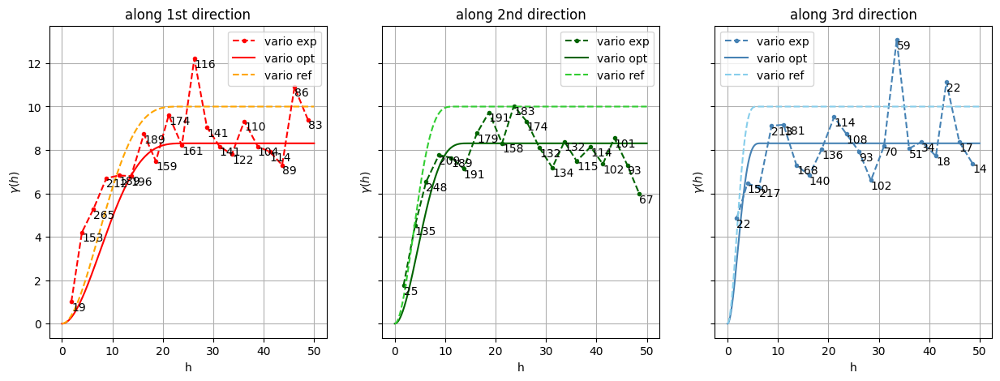

In [26]:
hmax1, hmax2, hmax3 = 50.0, 50.0, 50.0

(hexp1, gexp1, cexp1), (hexp2, gexp2, cexp2), (hexp3, gexp3, cexp3) = gn.covModel.variogramExp3D(
                x, v, alpha=0, beta=0, gamma=0, hmax=(hmax1, hmax2, hmax3),
                coord1_factor_loc_func=r_factor_inv_loc_func, 
                coord2_factor_loc_func=r_factor_inv_loc_func, 
                coord3_factor_loc_func=r_factor_inv_loc_func, 
                loc_m=10,
                ncla=(20, 20, 20), make_plot=False)

plt.subplots(1,3, sharey=True, figsize=(15,5))
plt.subplot(1,3,1)
gn.covModel.plot_variogramExp1D(hexp1, gexp1, cexp1, c='red', label='vario exp')
cov_model_opt.plot_model_one_curve(vario=True, main_axis=1, hmax=hmax1, c='red', label='vario opt')
cov_model_base.plot_model_one_curve(vario=True, main_axis=1, hmax=hmax1, c='orange', ls='dashed', label='vario ref')
plt.legend()
plt.title("along 1st direction")

plt.subplot(1,3,2)
gn.covModel.plot_variogramExp1D(hexp2, gexp2, cexp2, c='darkgreen', label='vario exp')
cov_model_opt.plot_model_one_curve(vario=True, main_axis=2, hmax=hmax2, c='darkgreen', label='vario opt')
cov_model_base.plot_model_one_curve(vario=True, main_axis=2, hmax=hmax2, c='limegreen', ls='dashed', label='vario ref')
plt.legend()
plt.title("along 2nd direction")

plt.subplot(1,3,3)
gn.covModel.plot_variogramExp1D(hexp3, gexp3, cexp3, c='steelblue', label='vario exp')
cov_model_opt.plot_model_one_curve(vario=True, main_axis=3, hmax=hmax3, c='steelblue', label='vario opt')
cov_model_base.plot_model_one_curve(vario=True, main_axis=3, hmax=hmax3, c='skyblue', ls='dashed', label='vario ref')
plt.legend()
plt.title("along 3rd direction")

plt.show()

### Kriging and conditional simulations

In [27]:
# Kriging
t1 = time.time() # start time
geosclassic_output = gn.geosclassicinterface.estimate(
                            cov_model_opt, (nx, ny, nz), (sx, sy, sz), (ox, oy, oz), 
                            x=x, v=v, 
                            method='simple_kriging', 
                            cov_model_non_stationarity_list=cov_model_non_stationarity_list,
                            nneighborMax=20,
                            nthreads=8)
t2 = time.time() # end time
print(f'Kriging - elapsed time: {t2-t1:.4g} sec')

# Retrieve kriging estimate and standard deviation
im_krig = geosclassic_output['image']

estimate: Preprocessing data done: final number of data points : 649, inequality data points: 0
estimate: Computational resources: nthreads = 8, nproc_sgs_at_ineq = 8
estimate: (Step 1) No inequality data
estimate: (Step 2) Set new dataset gathering data and inequality data locations...
estimate: (Step 3) Do kriging at the center of grid cells containing at least one data point...
estimate: (Step 4) Do kriging on the grid (at cell centers) using data points at cell centers...
estimate: Geos-Classic running on 1 process... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 8 thread(s)]
run_MPDSOMPGeosClassicSim: Geos-Classic running... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 8 thread(s)]
run_MPDSOMPGeosClassicSim: Geos-Classic run complete
estimate: Geos-Classic (1 process) run complete
estimate: warnings encountered (12023 times in all):
#  1: WARNING 02001: a neigbhor has been dropped (solving kriging system)
#  2: WARNING 02015: solving kriging system fails (do as if no neighbor)
Kr

In [28]:
# Simulation
nreal = 4
np.random.seed(231)
t1 = time.time() # start time
geosclassic_output = gn.geosclassicinterface.simulate(
                            cov_model_opt, (nx, ny, nz), (sx, sy, sz), (ox, oy, oz), 
                            x=x, v=v, 
                            method='simple_kriging', 
                            cov_model_non_stationarity_list=cov_model_non_stationarity_list,
                            nneighborMax=20,
                            nproc=4, nthreads_per_proc=4)
t2 = time.time() # end time
print(f'{nreal} simul. - elapsed time: {t2-t1:.4g} sec')

# Retrieve the realizations
simul = geosclassic_output['image']

# Compute mean and standard deviation (pixel-wise)
simul_mean = gn.img.imageContStat(simul, op='mean')
simul_std = gn.img.imageContStat(simul, op='std')

simulate: Preprocessing data done: final number of data points : 649, inequality data points: 0
simulate: number of process(es) has been changed (now: nproc=1)
simulate: Computational resources: nproc = 1, nthreads_per_proc = 4, nproc_sgs_at_ineq = 4
simulate: (Step 1) No inequality data
simulate: (Step 2) Set new dataset gathering data and inequality data locations...
simulate: (Step 3) Do kriging at the center of grid cells containing at least one data point...
simulate: (Step 4) Do sgs (1 realizations) on the grid (at cell centers) using data points at cell centers...
simulate: Geos-Classic running on 1 process... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 4 thread(s)]
run_MPDSOMPGeosClassicSim: Geos-Classic running... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 4 thread(s)]
run_MPDSOMPGeosClassicSim: Geos-Classic run complete
simulate: Geos-Classic (1 process) run complete
4 simul. - elapsed time: 2.667 sec


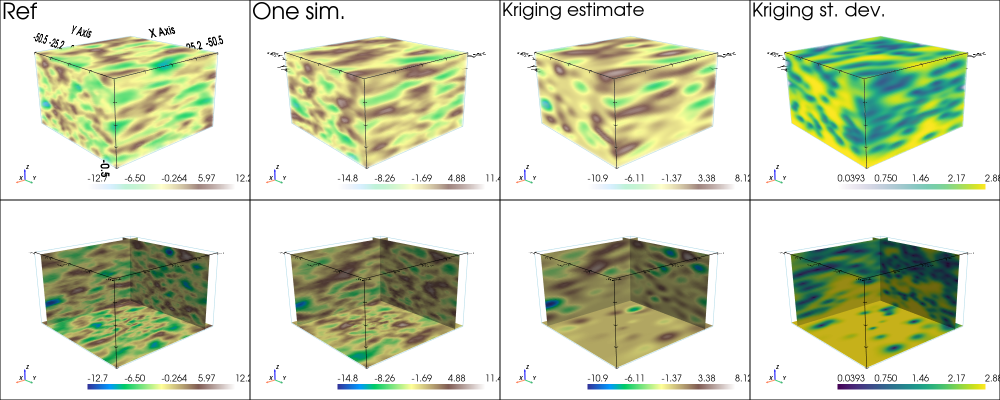

In [29]:
# Parameters for the 3D plot
lx, ly, lz = 0.1, 0.1, 0.01
slice_normal_x=(1-lx)*im.xmin()+lx*im.xmax()
slice_normal_y=(1-ly)*im.ymin()+ly*im.ymax()
slice_normal_z=(1-lz)*im.zmin()+lz*im.zmax()
# cpos=[(182.74662411073137, 218.7477610548302, 123.8258100805241),
#  (1.8237788203168197, 1.984870048014904, 22.292393091965078),
#  (-0.23019590790627398, -0.24857231558360507, 0.9408621832705422)]
# cpos = None

# Color settings
cmap = 'terrain'

# Plot "interactive in pop-up window" or "inline" (comment the undesired one) ...
# ... interactive (after closing the pop-up window, the position of the camera is retrieved in output)
#pp = pv.Plotter(shape=(3,2), notebook=False)
# ... inline
pp = pv.Plotter(shape=(2,4), window_size=[2000, 800])

cmin = im_ref.vmin()[0] # min value in ref
cmax = im_ref.vmax()[0] # max value in ref

pp.subplot(0, 0)
gn.imgplot3d.drawImage3D_volume(im_ref, plotter=pp, 
                                cmap=cmap, cmin=cmin, cmax=cmax, 
                                show_bounds=True, scalar_bar_kwargs={'title':1*' '}, # distinct titles for distinct color scales...
                                text='Ref')

pp.subplot(1, 0)
gn.imgplot3d.drawImage3D_slice(im_ref, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap=cmap, cmin=cmin, cmax=cmax, 
                               show_bounds=True, scalar_bar_kwargs={'title':2*' '})

i = 0 # realization index
cmin = simul.vmin()[i] # min value in simul #i
cmax = simul.vmax()[i] # max value in simul #i

pp.subplot(0, 1)
gn.imgplot3d.drawImage3D_volume(simul, iv=i, plotter=pp, 
                                cmap=cmap, cmin=cmin, cmax=cmax, 
                                show_bounds=True, scalar_bar_kwargs={'title':3*' '},
                                text='One sim.')

pp.subplot(1, 1)
gn.imgplot3d.drawImage3D_slice(simul, iv=i, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap=cmap, cmin=cmin, cmax=cmax, 
                               show_bounds=True, scalar_bar_kwargs={'title':4*' '})


cmin = im_krig.vmin()[0]
cmax = im_krig.vmax()[0]

pp.subplot(0, 2)
gn.imgplot3d.drawImage3D_volume(im_krig, iv=0, plotter=pp, 
                                cmap=cmap, cmin=cmin, cmax=cmax, 
                                show_bounds=True, scalar_bar_kwargs={'title':5*' '},
                                text='Kriging estimate')

pp.subplot(1, 2)
gn.imgplot3d.drawImage3D_slice(im_krig, iv=0, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap=cmap, cmin=cmin, cmax=cmax, 
                               show_bounds=True, scalar_bar_kwargs={'title':6*' '})


cmin = im_krig.vmin()[1]
cmax = im_krig.vmax()[1]

pp.subplot(0, 3)
gn.imgplot3d.drawImage3D_volume(im_krig, iv=1, plotter=pp, 
                                cmap='viridis', cmin=cmin, cmax=cmax, 
                                show_bounds=True, scalar_bar_kwargs={'title':7*' '},
                                text='Kriging st. dev.')

pp.subplot(1, 3)
gn.imgplot3d.drawImage3D_slice(im_krig, iv=1, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap='viridis', cmin=cmin, cmax=cmax, 
                               show_bounds=True, scalar_bar_kwargs={'title':8*' '})

pp.link_views()
pp.show(cpos=cpos)

## C. Non-stationary variance (sill)

### Reference covariance model and non-stationarity
Define first a *stationary* anisotropic reference covariance model in 3D. Then, add the desired non-stationarity feature.

In [30]:
# Define a reference covariance model (stationary)
cov_model_base = gn.covModel.CovModel3D(elem=[
    ('cubic', {'w':10, 'r':[24., 12., 6.]}), # elementary contribution
    ], alpha=0.0, beta=0.0, gamma=0.0, name='ref')

# Set list to handle non-stationarities
cov_model_non_stationarity_list = [
    ('multiply_w', im_w_factor.val[0]), # multiply weight by `im_w_factor.val[0]` over the grid
]


### Do an unconditional simulation (reference)

In [31]:
# Simulation
nreal = 1
np.random.seed(85)
geosclassic_output = gn.geosclassicinterface.simulate(
                        cov_model_base, (nx, ny, nz), (sx, sy, sz), (ox, oy, oz), 
                        method='simple_kriging', 
                        cov_model_non_stationarity_list=cov_model_non_stationarity_list,
                        nneighborMax=20, 
                        nreal=nreal, 
                        nproc=1, nthreads_per_proc=8)

im_ref = geosclassic_output['image']


simulate: Preprocessing data done: final number of data points : 0, inequality data points: 0
simulate: Computational resources: nproc = 1, nthreads_per_proc = 8, nproc_sgs_at_ineq = 8
simulate: (Step 1-3 skipped) No data
simulate: (Step 4) Do sgs (1 realizations) on the grid (at cell centers) using data points at cell centers...
simulate: Geos-Classic running on 1 process... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 8 thread(s)]
run_MPDSOMPGeosClassicSim: Geos-Classic running... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 8 thread(s)]
run_MPDSOMPGeosClassicSim: Geos-Classic run complete
simulate: Geos-Classic (1 process) run complete
simulate: warnings encountered (4 times in all):
#  1: WARNING 02001: a neigbhor has been dropped (solving kriging system)


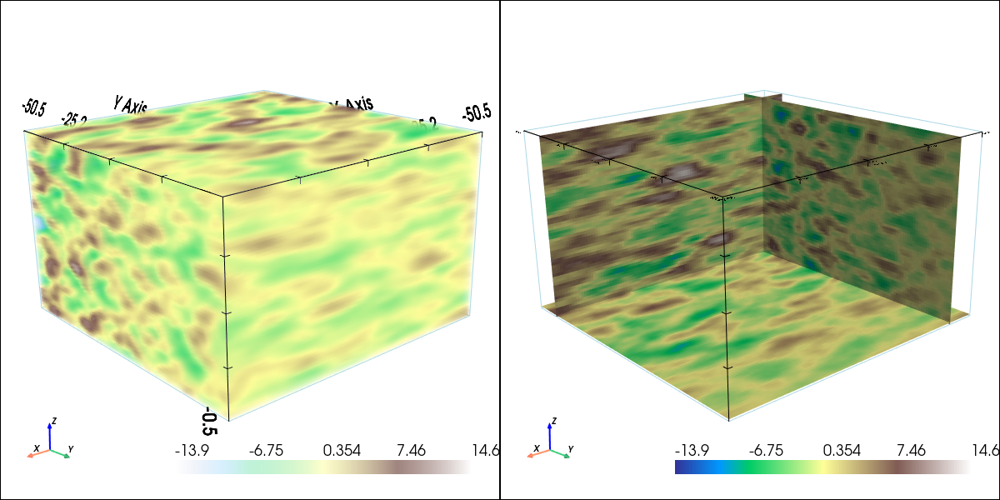

In [32]:
# Parameters for the 3D plot
lx, ly, lz = 0.1, 0.1, 0.01
slice_normal_x=(1-lx)*im.xmin()+lx*im.xmax()
slice_normal_y=(1-ly)*im.ymin()+ly*im.ymax()
slice_normal_z=(1-lz)*im.zmin()+lz*im.zmax()
# cpos=[(182.74662411073137, 218.7477610548302, 123.8258100805241),
#  (1.8237788203168197, 1.984870048014904, 22.292393091965078),
#  (-0.23019590790627398, -0.24857231558360507, 0.9408621832705422)]
# cpos = None

# Color settings
cmap = 'terrain'

cmin = im_ref.vmin()[0] # min value in ref
cmax = im_ref.vmax()[0] # max value in ref

# Plot "interactive in pop-up window" or "inline" (comment the undesired one) ...
# ... interactive (after closing the pop-up window, the position of the camera is retrieved in output)
#pp = pv.Plotter(shape=(1,3), notebook=False)
# ... inline
pp = pv.Plotter(shape=(1,2), window_size=[1200, 600])

pp.subplot(0, 0)
gn.imgplot3d.drawImage3D_volume(im_ref, plotter=pp, 
                                cmap=cmap, cmin=cmin, cmax=cmax, 
                                show_bounds=True, scalar_bar_kwargs={'title':''})

pp.subplot(0, 1)
gn.imgplot3d.drawImage3D_slice(im_ref, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap=cmap, cmin=cmin, cmax=cmax, 
                               show_bounds=True, scalar_bar_kwargs={'title':' '})

pp.link_views()
pp.show(cpos=cpos)

### Build a non-stationary data set (3D)

The data set is defined by extracting some points from the simulation of reference.

*Note:* the data set should contain enough points to catch the non-stationarities.

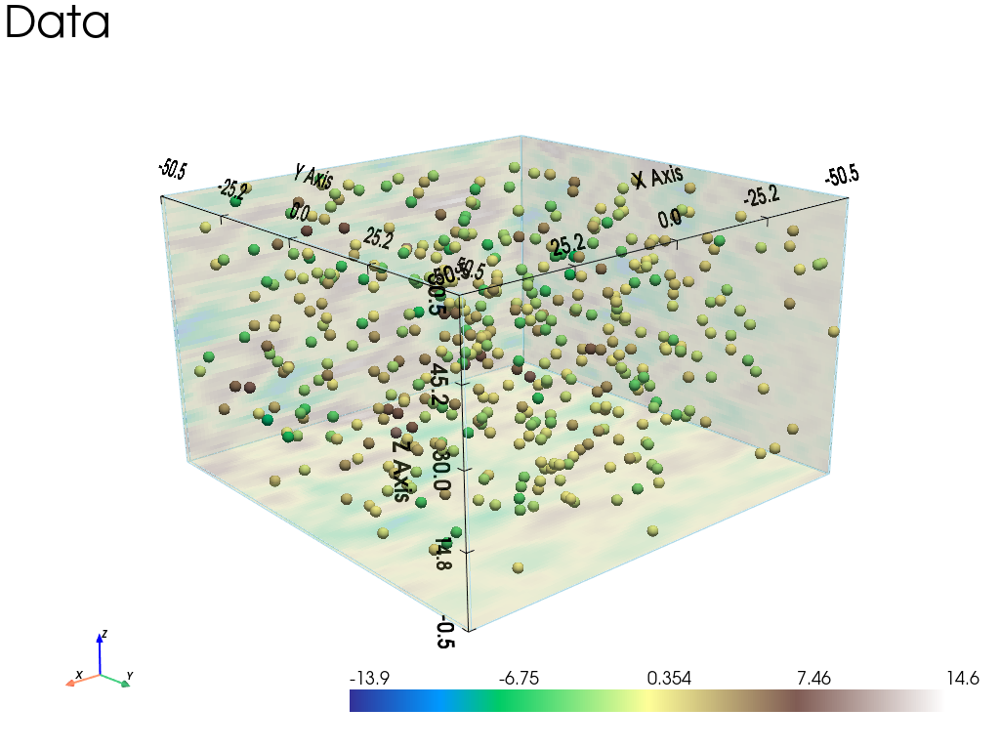

In [33]:
# Extract some points from the simulation
n = 450

# --- Choose 1. or 2. below ---
# # 1. Sampling the image
# ps = gn.img.sampleFromImage(im_ref, n, seed=234)
# # Data points and data value
# x = np.array((ps.x(), ps.y(), ps.z())).T
# v = ps.val[3]
# # Optionally: move points in the grid cells randomly, and add noise to values
# x[:, 0] = x[:, 0] + (np.random.random(n)-0.5)* im_ref.sx
# x[:, 1] = x[:, 1] + (np.random.random(n)-0.5)* im_ref.sy
# x[:, 2] = x[:, 2] + (np.random.random(n)-0.5)* im_ref.sz
# v = v + (np.random.random(n)-0.5)* 1.e-1

# 2. Using the function interpolating the image values
f = gn.img.Img_interp_func(im_ref)
np.random.seed(761)
x1 = im_ref.xmin() + np.random.random(n) * (im_ref.xmax()-im_ref.xmin())
x2 = im_ref.ymin() + np.random.random(n) * (im_ref.ymax()-im_ref.ymin())
x3 = im_ref.zmin() + np.random.random(n) * (im_ref.zmax()-im_ref.zmin())
x = np.array((x1, x2, x3)).T
v = f(x)
# ----- #

# Parameters for the 3D plot
# Color settings
cmap = 'terrain'

cmin = im_ref.vmin()[0] # min value in ref
cmax = im_ref.vmax()[0] # max value in ref

# Get colors for conditioning data according to their value and color settings
data_points_col = gn.imgplot.get_colors_from_values(v, cmap=cmap, cmin=cmin, cmax=cmax) 

# Set points to be plotted
data_points = pv.PolyData(x)
data_points['colors'] = data_points_col

# Plot "interactive in pop-up window" or "inline" (comment the undesired one) ...
# ... interactive (after closing the pop-up window, the position of the camera is retrieved in output)
#pp = pv.Plotter(shape=(1,3), notebook=False)
# ... inline
pp = pv.Plotter()

gn.imgplot3d.drawImage3D_slice(im_ref, plotter=pp, 
                               slice_normal_x=im_ref.xmin()+.01,
                               slice_normal_y=im_ref.ymin()+.01,
                               slice_normal_z=im_ref.zmin()+.01,
                               cmap=cmap, cmin=cmin, cmax=cmax, opacity=.3,
                               scalar_bar_kwargs={'vertical':False, 'title':'', 'title_font_size':18},
                               show_bounds=True)

pp.add_mesh(data_points, rgb=True, point_size=12., render_points_as_spheres=True)
pp.add_mesh(data_points.outline())
pp.show_bounds()
pp.add_text('Data')

pp.show(cpos=cpos)

### Simulation starting from a non-stationary data set in 3D and assuming "non-stationarity feature(s)" known

- `n`: number of data points
- `x`: location of data points (2-dimensional array of shape `(n, 3)`, each row is a point)
- `v`: values at data points (1-dimensional array of length `n`)
- `im_w_factor`: image of the factor (multiplier) `w_factor` in the grid; the function `w_factor_inv_loc_func` (interpolator of the inverse of `w_factor` in the grid) is built from this image

In [34]:
# Set a function interpolating the inverse of the w_factor (given location)
im_tmp = gn.img.copyImg(im_w_factor)
im_tmp.val = 1.0/im_tmp.val
w_factor_inv_loc_func = gn.img.Img_interp_func(im_tmp, ind=0)

### Fitting covariance model accounting for non-stationarity

In [35]:
cov_model_to_optimize = gn.covModel.CovModel3D(elem=[
        ('cubic', {'w':np.nan, 'r':[np.nan, np.nan, np.nan]}), # elementary contribution
         ], alpha=0.0, beta=0.0, gamma=0.0, name='') # angles are set to 0.0, non-sationarity is handled by *_loc_func below

t1 = time.time()
cov_model_opt, popt = gn.covModel.covModel3D_fit(x, v, cov_model_to_optimize, 
                w_factor_loc_func=w_factor_inv_loc_func, # deal with non-stationarity (multiplier for weight)
                loc_m=10, # loc_m > 0: number of sub-intervals btw pair of points to estimate local factor (default 1)
                         # loc_m = 0: take factor from one point
                bounds=([ 0,  0,  0,  0],  # min value for param. to fit
                        [40, 80, 80, 80]), # max value for param. to fit
                hmax=None, make_plot=False) # figure size for plot
t2 = time.time()
print(f'Fitting covariance model - elapsed time: {t2-t1:.4g} sec')

cov_model_opt

Fitting covariance model - elapsed time: 0.8158 sec


*** CovModel3D object ***
name = ''
number of elementary contribution(s): 1
elementary contribution 0
    type: cubic
    parameters:
        w = 9.049729132590093
        r = [np.float64(15.952827608955484), np.float64(17.098674066291775), np.float64(11.346212400131696)]
angles: alpha = 0.0, beta = 0.0, gamma = 0.0 (in degrees)
    i.e.: the system Ox'''y''''z''', supporting the axes of the model (ranges),
    is obtained from the system Oxyz as follows:
        Oxyz      -- rotation of angle -alpha around Oz  --> Ox'y'z'
        Ox'y'z'   -- rotation of angle -beta  around Ox' --> Ox''y''z''
        Ox''y''z''-- rotation of angle -gamma around Oy''--> Ox'''y'''z'''
*****

### Show experimental variogram, fitted model and reference model

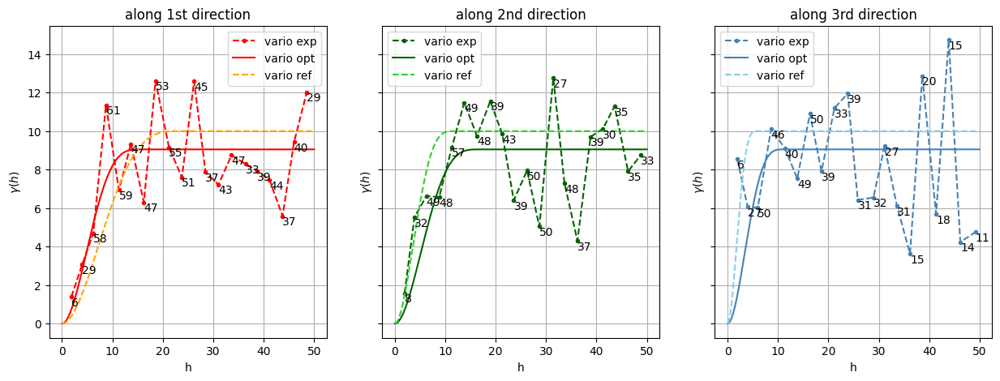

In [36]:
hmax1, hmax2, hmax3 = 50.0, 50.0, 50.0

(hexp1, gexp1, cexp1), (hexp2, gexp2, cexp2), (hexp3, gexp3, cexp3) = gn.covModel.variogramExp3D(
                x, v, alpha=0, beta=0, gamma=0, hmax=(hmax1, hmax2, hmax3),
                w_factor_loc_func=w_factor_inv_loc_func, loc_m=10,
                ncla=(20, 20, 20), make_plot=False)

plt.subplots(1,3, sharey=True, figsize=(15,5))
plt.subplot(1,3,1)
gn.covModel.plot_variogramExp1D(hexp1, gexp1, cexp1, c='red', label='vario exp')
cov_model_opt.plot_model_one_curve(vario=True, main_axis=1, hmax=hmax1, c='red', label='vario opt')
cov_model_base.plot_model_one_curve(vario=True, main_axis=1, hmax=hmax1, c='orange', ls='dashed', label='vario ref')
plt.legend()
plt.title("along 1st direction")

plt.subplot(1,3,2)
gn.covModel.plot_variogramExp1D(hexp2, gexp2, cexp2, c='darkgreen', label='vario exp')
cov_model_opt.plot_model_one_curve(vario=True, main_axis=2, hmax=hmax2, c='darkgreen', label='vario opt')
cov_model_base.plot_model_one_curve(vario=True, main_axis=2, hmax=hmax2, c='limegreen', ls='dashed', label='vario ref')
plt.legend()
plt.title("along 2nd direction")

plt.subplot(1,3,3)
gn.covModel.plot_variogramExp1D(hexp3, gexp3, cexp3, c='steelblue', label='vario exp')
cov_model_opt.plot_model_one_curve(vario=True, main_axis=3, hmax=hmax3, c='steelblue', label='vario opt')
cov_model_base.plot_model_one_curve(vario=True, main_axis=3, hmax=hmax3, c='skyblue', ls='dashed', label='vario ref')
plt.legend()
plt.title("along 3rd direction")

plt.show()

### Kriging and conditional simulations

In [37]:
# Kriging
t1 = time.time() # start time
geosclassic_output = gn.geosclassicinterface.estimate(
                        cov_model_opt, (nx, ny, nz), (sx, sy, sz), (ox, oy, oz), 
                        x=x, v=v, 
                        method='simple_kriging', 
                        cov_model_non_stationarity_list=cov_model_non_stationarity_list,
                        nneighborMax=20,
                        nthreads=8)
t2 = time.time() # end time
print(f'Kriging - elapsed time: {t2-t1:.4g} sec')

# Retrieve kriging estimate and standard deviation
im_krig = geosclassic_output['image']

estimate: Preprocessing data done: final number of data points : 450, inequality data points: 0
estimate: Computational resources: nthreads = 8, nproc_sgs_at_ineq = 8
estimate: (Step 1) No inequality data
estimate: (Step 2) Set new dataset gathering data and inequality data locations...
estimate: (Step 3) Do kriging at the center of grid cells containing at least one data point...
estimate: (Step 4) Do kriging on the grid (at cell centers) using data points at cell centers...
estimate: Geos-Classic running on 1 process... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 8 thread(s)]
run_MPDSOMPGeosClassicSim: Geos-Classic running... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 8 thread(s)]
run_MPDSOMPGeosClassicSim: Geos-Classic run complete
estimate: Geos-Classic (1 process) run complete
estimate: warnings encountered (1328 times in all):
#  1: WARNING 02001: a neigbhor has been dropped (solving kriging system)
#  2: WARNING 02015: solving kriging system fails (do as if no neighbor)
Kri

In [38]:
# Simulation
nreal = 4
np.random.seed(22131)
t1 = time.time() # start time
geosclassic_output = gn.geosclassicinterface.simulate(
                        cov_model_opt, (nx, ny, nz), (sx, sy, sz), (ox, oy, oz), 
                        x=x, v=v, 
                        method='simple_kriging', 
                        cov_model_non_stationarity_list=cov_model_non_stationarity_list,
                        nneighborMax=20,
                        nreal=nreal,
                        nproc=4, nthreads_per_proc=4)
t2 = time.time() # end time
print(f'{nreal} simul. - elapsed time: {t2-t1:.4g} sec')

# Retrieve the realizations
simul = geosclassic_output['image']

# Compute mean and standard deviation (pixel-wise)
simul_mean = gn.img.imageContStat(simul, op='mean')
simul_std = gn.img.imageContStat(simul, op='std')

simulate: Preprocessing data done: final number of data points : 450, inequality data points: 0
simulate: Computational resources: nproc = 4, nthreads_per_proc = 4, nproc_sgs_at_ineq = 16
simulate: (Step 1) No inequality data
simulate: (Step 2) Set new dataset gathering data and inequality data locations...
simulate: (Step 3) Do kriging at the center of grid cells containing at least one data point...
simulate: (Step 4) Do sgs (4 realizations) on the grid (at cell centers) using data points at cell centers...
simulate: Geos-Classic running on 4 process(es)... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 4 thread(s)]
run_MPDSOMPGeosClassicSim [pid=0]: Geos-Classic running... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 4 thread(s)]
run_MPDSOMPGeosClassicSim [pid=0]: Geos-Classic run complete
simulate: Geos-Classic (4 process(es)) run complete
4 simul. - elapsed time: 4.85 sec


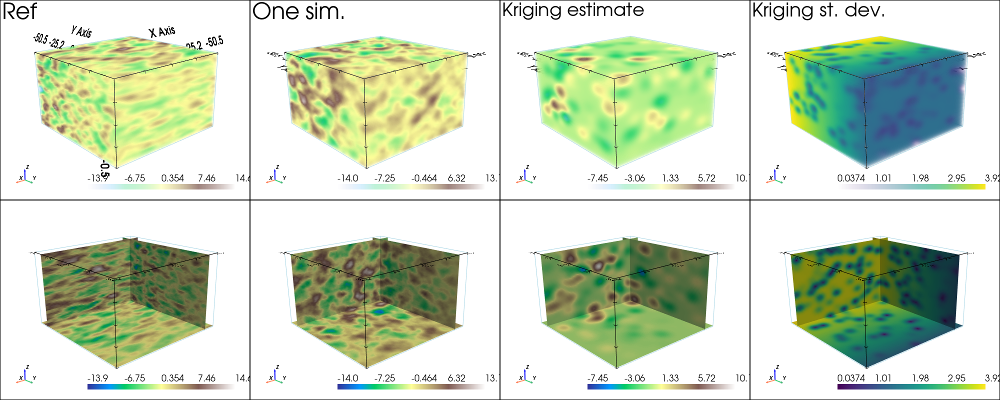

In [39]:
# Parameters for the 3D plot
lx, ly, lz = 0.1, 0.1, 0.01
slice_normal_x=(1-lx)*im.xmin()+lx*im.xmax()
slice_normal_y=(1-ly)*im.ymin()+ly*im.ymax()
slice_normal_z=(1-lz)*im.zmin()+lz*im.zmax()
# cpos=[(182.74662411073137, 218.7477610548302, 123.8258100805241),
#  (1.8237788203168197, 1.984870048014904, 22.292393091965078),
#  (-0.23019590790627398, -0.24857231558360507, 0.9408621832705422)]
# cpos = None

# Color settings
cmap = 'terrain'

# Plot "interactive in pop-up window" or "inline" (comment the undesired one) ...
# ... interactive (after closing the pop-up window, the position of the camera is retrieved in output)
#pp = pv.Plotter(shape=(3,2), notebook=False)
# ... inline
pp = pv.Plotter(shape=(2,4), window_size=[2000, 800])

cmin = im_ref.vmin()[0] # min value in ref
cmax = im_ref.vmax()[0] # max value in ref

pp.subplot(0, 0)
gn.imgplot3d.drawImage3D_volume(im_ref, plotter=pp, 
                                cmap=cmap, cmin=cmin, cmax=cmax, 
                                show_bounds=True, scalar_bar_kwargs={'title':1*' '}, # distinct titles for distinct color scales...
                                text='Ref')

pp.subplot(1, 0)
gn.imgplot3d.drawImage3D_slice(im_ref, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap=cmap, cmin=cmin, cmax=cmax, 
                               show_bounds=True, scalar_bar_kwargs={'title':2*' '})

i = 0 # realization index
cmin = simul.vmin()[i] # min value in simul #i
cmax = simul.vmax()[i] # max value in simul #i

pp.subplot(0, 1)
gn.imgplot3d.drawImage3D_volume(simul, iv=i, plotter=pp, 
                                cmap=cmap, cmin=cmin, cmax=cmax, 
                                show_bounds=True, scalar_bar_kwargs={'title':3*' '},
                                text='One sim.')

pp.subplot(1, 1)
gn.imgplot3d.drawImage3D_slice(simul, iv=i, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap=cmap, cmin=cmin, cmax=cmax, 
                               show_bounds=True, scalar_bar_kwargs={'title':4*' '})


cmin = im_krig.vmin()[0]
cmax = im_krig.vmax()[0]

pp.subplot(0, 2)
gn.imgplot3d.drawImage3D_volume(im_krig, iv=0, plotter=pp, 
                                cmap=cmap, cmin=cmin, cmax=cmax, 
                                show_bounds=True, scalar_bar_kwargs={'title':5*' '},
                                text='Kriging estimate')

pp.subplot(1, 2)
gn.imgplot3d.drawImage3D_slice(im_krig, iv=0, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap=cmap, cmin=cmin, cmax=cmax, 
                               show_bounds=True, scalar_bar_kwargs={'title':6*' '})


cmin = im_krig.vmin()[1]
cmax = im_krig.vmax()[1]

pp.subplot(0, 3)
gn.imgplot3d.drawImage3D_volume(im_krig, iv=1, plotter=pp, 
                                cmap='viridis', cmin=cmin, cmax=cmax, 
                                show_bounds=True, scalar_bar_kwargs={'title':7*' '},
                                text='Kriging st. dev.')

pp.subplot(1, 3)
gn.imgplot3d.drawImage3D_slice(im_krig, iv=1, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap='viridis', cmin=cmin, cmax=cmax, 
                               show_bounds=True, scalar_bar_kwargs={'title':8*' '})

pp.link_views()
pp.show(cpos=cpos)

## D. Non-stationary for orientation, ranges and variance (sill)

Note that the ranges are expressed in local axes, which are locally varying when non-stationary orientation is specified.

### Reference covariance model and non-stationarity
Define first a *stationary* anisotropic reference covariance model in 3D. Then, add the desired non-stationarity feature.

In [40]:
# Define a base covariance model (stationary)
cov_model_base = gn.covModel.CovModel3D(elem=[
    ('cubic', {'w':10, 'r':[24., 12., 6.]}), # elementary contribution
    ], alpha=0.0, beta=0.0, gamma=0.0, name='ref')

# Local rotation
# --------------
# Define the functions `alpha_loc_func`, (resp. `alpha_loc_func_xyz`) and that returns the angle(s) 
# alpha at given location(s) from one parameter: point(s) in 3D (resp. three parameters: x, y, z coordinate(s))
alpha_loc_func = gn.img.Img_interp_func(im_alpha, ind=0, angle_var=True)

def alpha_loc_func_xyz(x, y, z):
    x = np.atleast_1d(x)
    y = np.atleast_1d(y)
    z = np.atleast_1d(z)
    return alpha_loc_func(np.vstack((x.reshape(-1), y.reshape(-1), y.reshape(-1))).T).reshape(x.shape)

# Do the same for angle beta
beta_loc_func = gn.img.Img_interp_func(im_beta, ind=0)

def beta_loc_func_xyz(x, y, z):
    x = np.atleast_1d(x)
    y = np.atleast_1d(y)
    z = np.atleast_1d(z)
    return beta_loc_func(np.vstack((x.reshape(-1), y.reshape(-1), y.reshape(-1))).T).reshape(x.shape)

# Do the same for angle gamma
gamma_loc_func = gn.img.Img_interp_func(im_gamma, ind=0)

def gamma_loc_func_xyz(x, y, z):
    x = np.atleast_1d(x)
    y = np.atleast_1d(y)
    z = np.atleast_1d(z)
    return gamma_loc_func(np.vstack((x.reshape(-1), y.reshape(-1), y.reshape(-1))).T).reshape(x.shape)

# Set list to handle other non-stationarities
cov_model_non_stationarity_list = [
    ('multiply_r', im_r_factor.val[0]), # multiply range by `im_r_factor.val[0]` over the grid
    ('multiply_w', im_w_factor.val[0]), # multiply weight by `im_w_factor.val[0]` over the grid
]


### Do an unconditional simulation (reference)

In [41]:
# Simulation
nreal = 1
np.random.seed(2332)
geosclassic_output = gn.geosclassicinterface.simulate(
                        cov_model_base, (nx, ny, nz), (sx, sy, sz), (ox, oy, oz), 
                        method='simple_kriging', 
                        alpha=alpha_loc_func_xyz,
                        beta=beta_loc_func_xyz,
                        gamma=gamma_loc_func_xyz,
                        cov_model_non_stationarity_list=cov_model_non_stationarity_list,
                        nneighborMax=20, nreal=nreal, 
                        nproc=1, nthreads_per_proc=8)

im_ref = geosclassic_output['image']


simulate: Preprocessing data done: final number of data points : 0, inequality data points: 0
simulate: Computational resources: nproc = 1, nthreads_per_proc = 8, nproc_sgs_at_ineq = 8
simulate: (Step 1-3 skipped) No data
simulate: (Step 4) Do sgs (1 realizations) on the grid (at cell centers) using data points at cell centers...
simulate: Geos-Classic running on 1 process... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 8 thread(s)]
run_MPDSOMPGeosClassicSim: Geos-Classic running... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 8 thread(s)]
run_MPDSOMPGeosClassicSim: Geos-Classic run complete
simulate: Geos-Classic (1 process) run complete
simulate: warnings encountered (40 times in all):
#  1: WARNING 02001: a neigbhor has been dropped (solving kriging system)


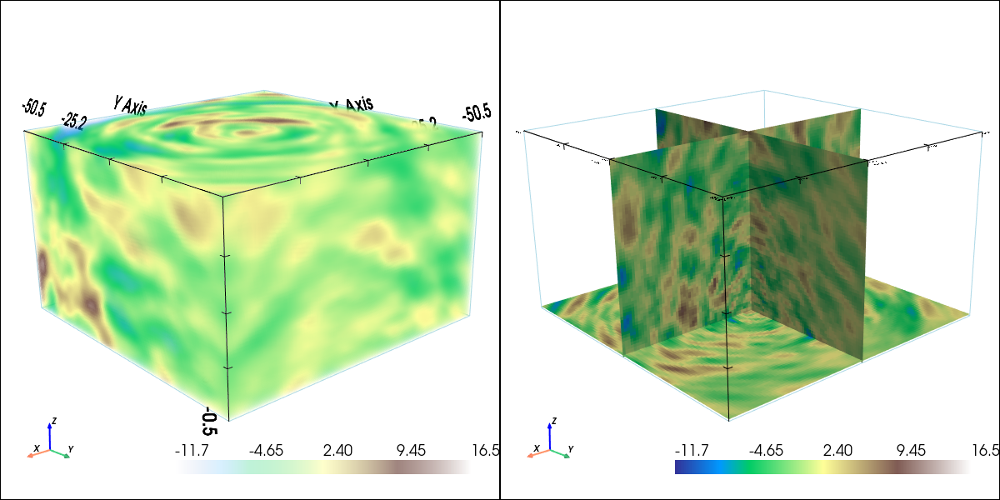

In [42]:
# Parameters for the 3D plot
lx, ly, lz = 0.5, 0.5, 0.01
slice_normal_x=(1-lx)*im.xmin()+lx*im.xmax()
slice_normal_y=(1-ly)*im.ymin()+ly*im.ymax()
slice_normal_z=(1-lz)*im.zmin()+lz*im.zmax()
# cpos=[(182.74662411073137, 218.7477610548302, 123.8258100805241),
#  (1.8237788203168197, 1.984870048014904, 22.292393091965078),
#  (-0.23019590790627398, -0.24857231558360507, 0.9408621832705422)]
# cpos = None

# Color settings
cmap = 'terrain'

cmin = im_ref.vmin()[0] # min value in ref
cmax = im_ref.vmax()[0] # max value in ref

# Plot "interactive in pop-up window" or "inline" (comment the undesired one) ...
# ... interactive (after closing the pop-up window, the position of the camera is retrieved in output)
#pp = pv.Plotter(shape=(1,3), notebook=False)
# ... inline
pp = pv.Plotter(shape=(1,2), window_size=[1200, 600])

pp.subplot(0, 0)
gn.imgplot3d.drawImage3D_volume(im_ref, plotter=pp, 
                                cmap=cmap, cmin=cmin, cmax=cmax, 
                                show_bounds=True, scalar_bar_kwargs={'title':''})

pp.subplot(0, 1)
gn.imgplot3d.drawImage3D_slice(im_ref, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap=cmap, cmin=cmin, cmax=cmax, 
                               show_bounds=True, scalar_bar_kwargs={'title':' '})

pp.link_views()
pp.show(cpos=cpos)

### Build a non-stationary data set (3D)

The data set is defined by extracting some points from the simulation of reference.

*Note:* the data set should contain enough points to catch the non-stationarities.

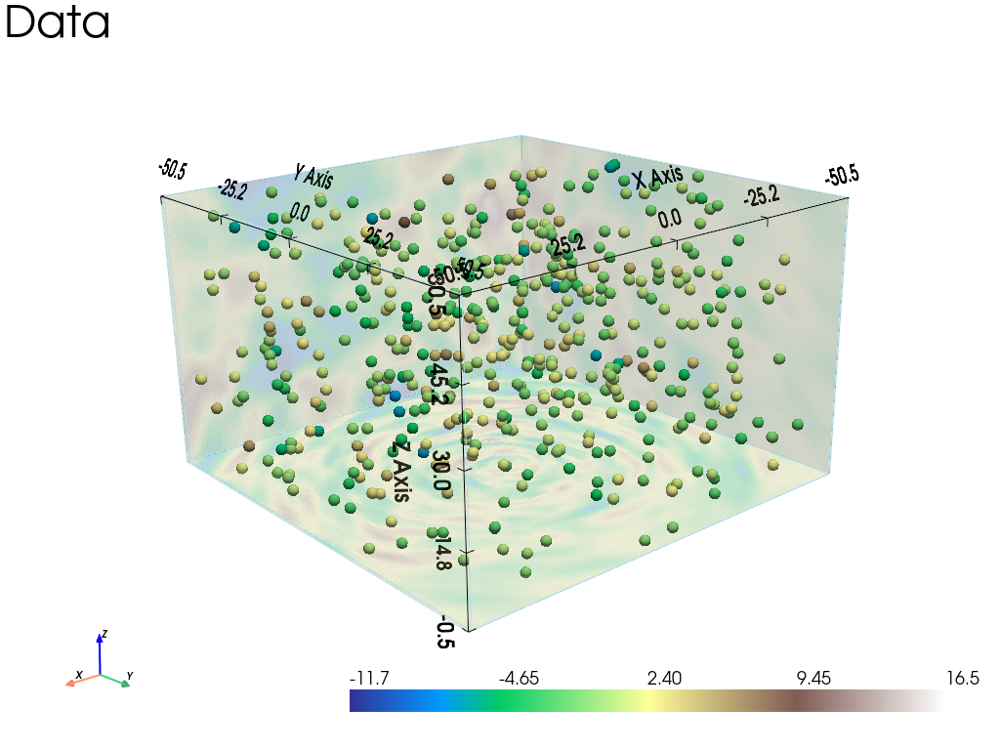

In [43]:
# Extract some points from the simulation
n = 480

# --- Choose 1. or 2. below ---
# # 1. Sampling the image
# ps = gn.img.sampleFromImage(im_ref, n, seed=234)
# # Data points and data value
# x = np.array((ps.x(), ps.y(), ps.z())).T
# v = ps.val[3]
# # Optionally: move points in the grid cells randomly, and add noise to values
# x[:, 0] = x[:, 0] + (np.random.random(n)-0.5)* im_ref.sx
# x[:, 1] = x[:, 1] + (np.random.random(n)-0.5)* im_ref.sy
# x[:, 2] = x[:, 2] + (np.random.random(n)-0.5)* im_ref.sz
# v = v + (np.random.random(n)-0.5)* 1.e-1

# 2. Using the function interpolating the image values
f = gn.img.Img_interp_func(im_ref)
np.random.seed(973)
x1 = im_ref.xmin() + np.random.random(n) * (im_ref.xmax()-im_ref.xmin())
x2 = im_ref.ymin() + np.random.random(n) * (im_ref.ymax()-im_ref.ymin())
x3 = im_ref.zmin() + np.random.random(n) * (im_ref.zmax()-im_ref.zmin())
x = np.array((x1, x2, x3)).T
v = f(x)
# ----- #

# Parameters for the 3D plot
# Color settings
cmap = 'terrain'

cmin = im_ref.vmin()[0] # min value in ref
cmax = im_ref.vmax()[0] # max value in ref

# Get colors for conditioning data according to their value and color settings
data_points_col = gn.imgplot.get_colors_from_values(v, cmap=cmap, cmin=cmin, cmax=cmax) 

# Set points to be plotted
data_points = pv.PolyData(x)
data_points['colors'] = data_points_col

# Plot "interactive in pop-up window" or "inline" (comment the undesired one) ...
# ... interactive (after closing the pop-up window, the position of the camera is retrieved in output)
#pp = pv.Plotter(shape=(1,3), notebook=False)
# ... inline
pp = pv.Plotter()

gn.imgplot3d.drawImage3D_slice(im_ref, plotter=pp, 
                               slice_normal_x=im_ref.xmin()+.01,
                               slice_normal_y=im_ref.ymin()+.01,
                               slice_normal_z=im_ref.zmin()+.01,
                               cmap=cmap, cmin=cmin, cmax=cmax, opacity=.3,
                               scalar_bar_kwargs={'vertical':False, 'title':'', 'title_font_size':18},
                               show_bounds=True)

pp.add_mesh(data_points, rgb=True, point_size=12., render_points_as_spheres=True)
pp.add_mesh(data_points.outline())
pp.show_bounds()
pp.add_text('Data')

pp.show(cpos=cpos)

### Simulation starting from a non-stationary data set in 3D and assuming "non-stationarity feature(s)" known

- `n`: number of data points
- `x`: location of data points (2-dimensional array of shape `(n, 3)`, each row is a point)
- `v`: values at data points (1-dimensional array of length `n`)
- `im_alpha`, `im_beta`, `im_gamma`: images of the angle `alpha`, `beta`, `gamma` in the grid, determining the local orientation of the covariance model; the functions `alpha_loc_func`, `beta_loc_func`, `gamma_loc_func` (resp. `alpha_loc_func_xyz`, `beta_loc_func_xyz`, `gamma_loc_func_xyz`) which are interpolators in the grid taking one parameter, points in 3D (resp. three parameters, the x, y and z coordinates of points in 3D)
- `im_r_factor`: image of the factor (multiplier) `r_factor` in the grid; the function `r_factor_inv_loc_func` (interpolator of the inverse of `r_factor` in the grid) is built from this image
- `im_w_factor`: image of the factor (multiplier) `w_factor` in the grid; the function `w_factor_inv_loc_func` (interpolator of the inverse of `w_factor` in the grid) is built from this image

In [44]:
# Set a function interpolating the inverse of the r_factor (given location)
im_tmp = gn.img.copyImg(im_r_factor)
im_tmp.val = 1.0/im_tmp.val
r_factor_inv_loc_func = gn.img.Img_interp_func(im_tmp, ind=0)

# Set a function interpolating the inverse of the w_factor (given location)
im_tmp = gn.img.copyImg(im_w_factor)
im_tmp.val = 1.0/im_tmp.val
w_factor_inv_loc_func = gn.img.Img_interp_func(im_tmp, ind=0)

### Fitting covariance model accounting for non-stationarity

In [45]:
cov_model_to_optimize = gn.covModel.CovModel3D(elem=[
        ('cubic', {'w':np.nan, 'r':[np.nan, np.nan, np.nan]}), # elementary contribution
         ], alpha=0.0, beta=0.0, gamma=0.0, name='') # angles are set to 0.0, non-sationarity is handled by *_loc_func below

t1 = time.time()
cov_model_opt, popt = gn.covModel.covModel3D_fit(x, v, cov_model_to_optimize, 
                alpha_loc_func=alpha_loc_func, # deal with non-stationarity (orientation)
                beta_loc_func=beta_loc_func, 
                gamma_loc_func=gamma_loc_func, 
                coord1_factor_loc_func=r_factor_inv_loc_func, # deal with non-stationarity (multiplier for range along each axis)
                coord2_factor_loc_func=r_factor_inv_loc_func, 
                coord3_factor_loc_func=r_factor_inv_loc_func, 
                w_factor_loc_func=w_factor_inv_loc_func, # deal with non-stationarity (multiplier for weight)
                loc_m=10, # loc_m > 0: number of sub-intervals btw pair of points to estimate local factor (default 1)
                         # loc_m = 0: take factor from one point
                bounds=([ 0,  0,  0,  0],  # min value for param. to fit
                        [40, 80, 80, 80]), # max value for param. to fit
                hmax=None, make_plot=False) # figure size for plot
t2 = time.time()
print(f'Fitting covariance model - elapsed time: {t2-t1:.4g} sec')

cov_model_opt

Fitting covariance model - elapsed time: 5.854 sec


*** CovModel3D object ***
name = ''
number of elementary contribution(s): 1
elementary contribution 0
    type: cubic
    parameters:
        w = 7.851576430905393
        r = [np.float64(29.363053223367302), np.float64(11.378374044495086), np.float64(9.697341976295098)]
angles: alpha = 0.0, beta = 0.0, gamma = 0.0 (in degrees)
    i.e.: the system Ox'''y''''z''', supporting the axes of the model (ranges),
    is obtained from the system Oxyz as follows:
        Oxyz      -- rotation of angle -alpha around Oz  --> Ox'y'z'
        Ox'y'z'   -- rotation of angle -beta  around Ox' --> Ox''y''z''
        Ox''y''z''-- rotation of angle -gamma around Oy''--> Ox'''y'''z'''
*****

#### Cross-validation by leave-one-out error

----- CRPS (negative; the larger, the better) -----
   mean = -1.274
   def. = -0.6089
----- 1) "Normal law test for mean of normalized error" -----
   p-value = 0.8204
   success = True (wrt significance level 0.05)
      (-> model has no reason to be rejected)
----- 2) "Chi-square test for sum of squares of normalized error" -----
   p-value = 5.548e-08
   success = False (wrt significance level 0.05)
      -> model should be REJECTED
----- Statistics of normalized error -----
   mean     = 0.01036 (should be close to 0)
   std      = 1.175 (should be close to 1)
   skewness = -0.1364 (should be close to 0)
   excess kurtosis = 0.1435 (should be close to 0)


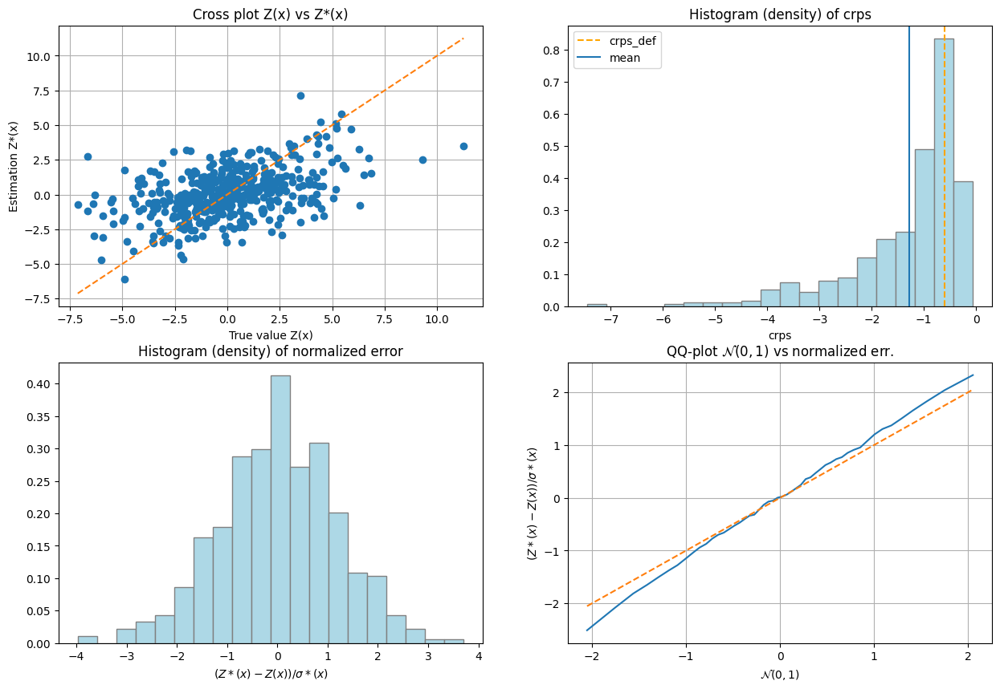

In [46]:
# Set a function interpolating the r_factor (given location)
r_factor_loc_func = gn.img.Img_interp_func(im_r_factor, ind=0) 

# Set a function interpolating the r_factor (given location)
w_factor_loc_func = gn.img.Img_interp_func(im_w_factor, ind=0) 

# Set list to handle non-stationarities at x
cov_model_non_stationarity_x_list = [
    ('multiply_r', r_factor_loc_func(x)),
    ('multiply_w', w_factor_loc_func(x))
]

# Interpolation by simple kriging
cv_est1, cv_std1, crps1, crps_def1, pvalue1, success1 = gn.covModel.cross_valid_loo(
                                        x, v, cov_model_opt,
                                        interpolator=gn.covModel.krige, 
                                        interpolator_kwargs={'method':'ordinary_kriging'},
                                        alpha_x=alpha_loc_func(x), # specify angle at data points
                                        beta_x=beta_loc_func(x), # specify angle at data points
                                        gamma_x=gamma_loc_func(x), # specify angle at data points
                                        cov_model_non_stationarity_x_list=cov_model_non_stationarity_x_list,
                                        print_result=True, make_plot=True, figsize=(15,10), nbins=20)
plt.show()

### Show experimental variogram, fitted model and reference model

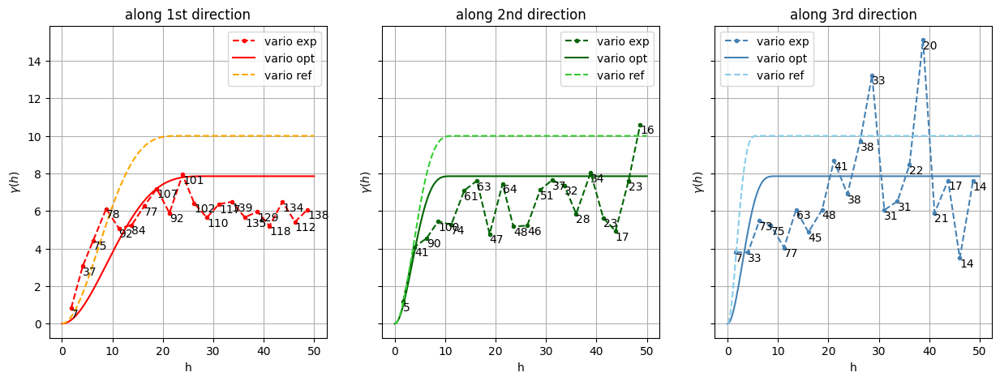

In [47]:
hmax1, hmax2, hmax3 = 50.0, 50.0, 50.0

(hexp1, gexp1, cexp1), (hexp2, gexp2, cexp2), (hexp3, gexp3, cexp3) = gn.covModel.variogramExp3D(
                x, v, alpha=0, beta=0, gamma=0, hmax=(hmax1, hmax2, hmax3),
                alpha_loc_func=alpha_loc_func, beta_loc_func=beta_loc_func, gamma_loc_func=gamma_loc_func, loc_m=10,
                ncla=(20, 20, 20), make_plot=False)

plt.subplots(1,3, sharey=True, figsize=(15,5))
plt.subplot(1,3,1)
gn.covModel.plot_variogramExp1D(hexp1, gexp1, cexp1, c='red', label='vario exp')
cov_model_opt.plot_model_one_curve(vario=True, main_axis=1, hmax=hmax1, c='red', label='vario opt')
cov_model_base.plot_model_one_curve(vario=True, main_axis=1, hmax=hmax1, c='orange', ls='dashed', label='vario ref')
plt.legend()
plt.title("along 1st direction")

plt.subplot(1,3,2)
gn.covModel.plot_variogramExp1D(hexp2, gexp2, cexp2, c='darkgreen', label='vario exp')
cov_model_opt.plot_model_one_curve(vario=True, main_axis=2, hmax=hmax2, c='darkgreen', label='vario opt')
cov_model_base.plot_model_one_curve(vario=True, main_axis=2, hmax=hmax2, c='limegreen', ls='dashed', label='vario ref')
plt.legend()
plt.title("along 2nd direction")

plt.subplot(1,3,3)
gn.covModel.plot_variogramExp1D(hexp3, gexp3, cexp3, c='steelblue', label='vario exp')
cov_model_opt.plot_model_one_curve(vario=True, main_axis=3, hmax=hmax3, c='steelblue', label='vario opt')
cov_model_base.plot_model_one_curve(vario=True, main_axis=3, hmax=hmax3, c='skyblue', ls='dashed', label='vario ref')
plt.legend()
plt.title("along 3rd direction")

plt.show()

### Kriging and conditional simulations

In [48]:
# Kriging
t1 = time.time() # start time
geosclassic_output = gn.geosclassicinterface.estimate(
                        cov_model_opt, (nx, ny, nz), (sx, sy, sz), (ox, oy, oz), 
                        x=x, v=v, 
                        method='simple_kriging',
                        alpha=alpha_loc_func_xyz,
                        beta=beta_loc_func_xyz,
                        gamma=gamma_loc_func_xyz,
                        cov_model_non_stationarity_list=cov_model_non_stationarity_list,
                        nneighborMax=20,
                        nthreads=8)
t2 = time.time() # end time
print(f'Kriging - elapsed time: {t2-t1:.4g} sec')

# Retrieve kriging estimate and standard deviation
im_krig = geosclassic_output['image']

estimate: Preprocessing data done: final number of data points : 480, inequality data points: 0
estimate: Computational resources: nthreads = 8, nproc_sgs_at_ineq = 8
estimate: (Step 1) No inequality data
estimate: (Step 2) Set new dataset gathering data and inequality data locations...
estimate: (Step 3) Do kriging at the center of grid cells containing at least one data point...
estimate: (Step 4) Do kriging on the grid (at cell centers) using data points at cell centers...
estimate: Geos-Classic running on 1 process... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 8 thread(s)]
run_MPDSOMPGeosClassicSim: Geos-Classic running... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 8 thread(s)]
run_MPDSOMPGeosClassicSim: Geos-Classic run complete
estimate: Geos-Classic (1 process) run complete
estimate: warnings encountered (9669 times in all):
#  1: WARNING 02001: a neigbhor has been dropped (solving kriging system)
#  2: WARNING 02015: solving kriging system fails (do as if no neighbor)
Kri

In [49]:
# Kriging
t1 = time.time() # start time
geosclassic_output = gn.geosclassicinterface.estimate(
                            cov_model_opt, (nx, ny, nz), (sx, sy, sz), (ox, oy, oz), 
                            x=x, v=v, 
                            method='simple_kriging',
                            alpha=alpha_loc_func_xyz,
                            beta=beta_loc_func_xyz,
                            gamma=gamma_loc_func_xyz,
                            cov_model_non_stationarity_list=cov_model_non_stationarity_list,
                            nneighborMax=20,
                            nthreads=8)
t2 = time.time() # end time
print(f'Kriging - elapsed time: {t2-t1:.4g} sec')

# Retrieve kriging estimate and standard deviation
im_krig = geosclassic_output['image']

estimate: Preprocessing data done: final number of data points : 480, inequality data points: 0
estimate: Computational resources: nthreads = 8, nproc_sgs_at_ineq = 8
estimate: (Step 1) No inequality data
estimate: (Step 2) Set new dataset gathering data and inequality data locations...
estimate: (Step 3) Do kriging at the center of grid cells containing at least one data point...
estimate: (Step 4) Do kriging on the grid (at cell centers) using data points at cell centers...
estimate: Geos-Classic running on 1 process... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 8 thread(s)]
run_MPDSOMPGeosClassicSim: Geos-Classic running... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 8 thread(s)]
run_MPDSOMPGeosClassicSim: Geos-Classic run complete
estimate: Geos-Classic (1 process) run complete
estimate: warnings encountered (9669 times in all):
#  1: WARNING 02001: a neigbhor has been dropped (solving kriging system)
#  2: WARNING 02015: solving kriging system fails (do as if no neighbor)
Kri

In [50]:
# Simulation
nreal = 4
np.random.seed(22131)
t1 = time.time() # start time
geosclassic_output = gn.geosclassicinterface.simulate(
                            cov_model_opt, (nx, ny, nz), (sx, sy, sz), (ox, oy, oz), 
                            x=x, v=v, 
                            method='simple_kriging',
                            alpha=alpha_loc_func_xyz,
                            beta=beta_loc_func_xyz,
                            gamma=gamma_loc_func_xyz,
                            cov_model_non_stationarity_list=cov_model_non_stationarity_list,
                            nneighborMax=20,
                            nreal=nreal,
                            nproc=4, nthreads_per_proc=4)
t2 = time.time() # end time
print(f'{nreal} simul. - elapsed time: {t2-t1:.4g} sec')

# Retrieve the realizations
simul = geosclassic_output['image']

# Compute mean and standard deviation (pixel-wise)
simul_mean = gn.img.imageContStat(simul, op='mean')
simul_std = gn.img.imageContStat(simul, op='std')

simulate: Preprocessing data done: final number of data points : 480, inequality data points: 0
simulate: Computational resources: nproc = 4, nthreads_per_proc = 4, nproc_sgs_at_ineq = 16
simulate: (Step 1) No inequality data
simulate: (Step 2) Set new dataset gathering data and inequality data locations...
simulate: (Step 3) Do kriging at the center of grid cells containing at least one data point...
simulate: (Step 4) Do sgs (4 realizations) on the grid (at cell centers) using data points at cell centers...
simulate: Geos-Classic running on 4 process(es)... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 4 thread(s)]
run_MPDSOMPGeosClassicSim [pid=0]: Geos-Classic running... [VERSION 2.1 / BUILD NUMBER 20251023 / OpenMP 4 thread(s)]
run_MPDSOMPGeosClassicSim [pid=0]: Geos-Classic run complete
simulate: Geos-Classic (4 process(es)) run complete
simulate: warnings encountered (25 times in all):
#  1: WARNING 02001: a neigbhor has been dropped (solving kriging system)
4 simul. - elapsed t

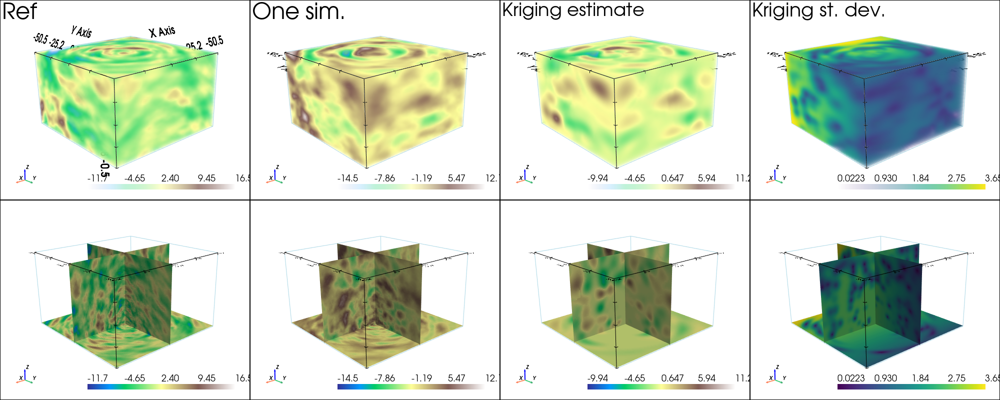

In [51]:
# Parameters for the 3D plot
lx, ly, lz = 0.5, 0.5, 0.01
slice_normal_x=(1-lx)*im.xmin()+lx*im.xmax()
slice_normal_y=(1-ly)*im.ymin()+ly*im.ymax()
slice_normal_z=(1-lz)*im.zmin()+lz*im.zmax()
# cpos=[(182.74662411073137, 218.7477610548302, 123.8258100805241),
#  (1.8237788203168197, 1.984870048014904, 22.292393091965078),
#  (-0.23019590790627398, -0.24857231558360507, 0.9408621832705422)]
# cpos = None

# Color settings
cmap = 'terrain'

# Plot "interactive in pop-up window" or "inline" (comment the undesired one) ...
# ... interactive (after closing the pop-up window, the position of the camera is retrieved in output)
#pp = pv.Plotter(shape=(3,2), notebook=False)
# ... inline
pp = pv.Plotter(shape=(2,4), window_size=[2000, 800])

cmin = im_ref.vmin()[0] # min value in ref
cmax = im_ref.vmax()[0] # max value in ref

pp.subplot(0, 0)
gn.imgplot3d.drawImage3D_volume(im_ref, plotter=pp, 
                                cmap=cmap, cmin=cmin, cmax=cmax, 
                                show_bounds=True, scalar_bar_kwargs={'title':1*' '}, # distinct titles for distinct color scales...
                                text='Ref')

pp.subplot(1, 0)
gn.imgplot3d.drawImage3D_slice(im_ref, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap=cmap, cmin=cmin, cmax=cmax, 
                               show_bounds=True, scalar_bar_kwargs={'title':2*' '})

i = 0 # realization index
cmin = simul.vmin()[i] # min value in simul #i
cmax = simul.vmax()[i] # max value in simul #i

pp.subplot(0, 1)
gn.imgplot3d.drawImage3D_volume(simul, iv=i, plotter=pp, 
                                cmap=cmap, cmin=cmin, cmax=cmax, 
                                show_bounds=True, scalar_bar_kwargs={'title':3*' '},
                                text='One sim.')

pp.subplot(1, 1)
gn.imgplot3d.drawImage3D_slice(simul, iv=i, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap=cmap, cmin=cmin, cmax=cmax, 
                               show_bounds=True, scalar_bar_kwargs={'title':4*' '})


cmin = im_krig.vmin()[0]
cmax = im_krig.vmax()[0]

pp.subplot(0, 2)
gn.imgplot3d.drawImage3D_volume(im_krig, iv=0, plotter=pp, 
                                cmap=cmap, cmin=cmin, cmax=cmax, 
                                show_bounds=True, scalar_bar_kwargs={'title':5*' '},
                                text='Kriging estimate')

pp.subplot(1, 2)
gn.imgplot3d.drawImage3D_slice(im_krig, iv=0, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap=cmap, cmin=cmin, cmax=cmax, 
                               show_bounds=True, scalar_bar_kwargs={'title':6*' '})


cmin = im_krig.vmin()[1]
cmax = im_krig.vmax()[1]

pp.subplot(0, 3)
gn.imgplot3d.drawImage3D_volume(im_krig, iv=1, plotter=pp, 
                                cmap='viridis', cmin=cmin, cmax=cmax, 
                                show_bounds=True, scalar_bar_kwargs={'title':7*' '},
                                text='Kriging st. dev.')

pp.subplot(1, 3)
gn.imgplot3d.drawImage3D_slice(im_krig, iv=1, plotter=pp, 
                               slice_normal_x=slice_normal_x,
                               slice_normal_y=slice_normal_y,
                               slice_normal_z=slice_normal_z,
                               cmap='viridis', cmin=cmin, cmax=cmax, 
                               show_bounds=True, scalar_bar_kwargs={'title':8*' '})

pp.link_views()
pp.show(cpos=cpos)